# Computational Linear Algebra: (PCA) Principal Compnent Analysis

## Initialization:
Fill the missing values in this text box and in the following code-cell.

**Academic Year:** 2024/2025

### Team Members (Alphabetical Order):
1. Ahmadzadeh, Hossein (S338150);
2. Panda, Dristant (S336981).

In [1]:
StudentID1 = 338150
StudentID2 = 336981

## Starting Code-Cell 
### Attention: DO NOT CHANGE THE CODE INSIDE THE FOLLOWING CELL!

In [2]:
import numpy as np

var_entertainment_feat_types = ['Interests', 'Movies', 'Music']
var_personal_feat_types = ['Finance', 'Phobias']
fixed_feat_types = ['Personality', 'Health']

label_types = ['Demographic']

variables_by_type = {
    'Demographics': ['Age', 'Height', 'Weight', 'Number of siblings', 
                     'Gender', 'Hand', 'Education', 'Only child', 'Home Town Type',
                     'Home Type'],
    'Finance': ['Finances', 'Shopping centres', 'Branded clothing', 
                'Entertainment spending', 'Spending on looks', 
                'Spending on gadgets', 'Spending on healthy eating'],
    'Health': ['Smoking', 'Alcohol', 'Healthy eating'],
    'Interests': ['History', 'Psychology', 'Politics', 'Mathematics', 
                  'Physics', 'Internet', 'PC', 'Economy Management', 
                  'Biology', 'Chemistry', 'Reading', 'Geography', 
                  'Foreign languages', 'Medicine', 'Law', 'Cars', 
                  'Art exhibitions', 'Religion', 'Countryside, outdoors', 
                  'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 
                  'Active sport', 'Gardening', 'Celebrities', 'Shopping', 
                  'Science and technology', 'Theatre', 'Fun with friends', 
                  'Adrenaline sports', 'Pets'],
    'Movies': ['Movies', 'Horror', 'Thriller', 'Comedy', 'Romantic', 
               'Sci-fi', 'War', 'Fantasy/Fairy tales', 'Animated', 
               'Documentary', 'Western', 'Action'],
    'Music': ['Music', 'Slow songs or fast songs', 'Dance', 'Folk', 
              'Country', 'Classical music', 'Musical', 'Pop', 'Rock', 
              'Metal or Hardrock', 'Punk', 'Hiphop, Rap', 'Reggae, Ska', 
              'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 
              'Techno, Trance', 'Opera'],
    'Personality': ['Daily events', 'Prioritising workload', 
                    'Writing notes', 'Workaholism', 'Thinking ahead', 
                    'Final judgement', 'Reliability', 'Keeping promises', 
                    'Loss of interest', 'Friends versus money', 'Funniness', 
                    'Fake', 'Criminal damage', 'Decision making', 'Elections', 
                    'Self-criticism', 'Judgment calls', 'Hypochondria', 
                    'Empathy', 'Eating to survive', 'Giving', 
                    'Compassion to animals', 'Borrowed stuff', 
                    'Loneliness', 'Cheating in school', 'Health', 
                    'Changing the past', 'God', 'Dreams', 'Charity', 
                    'Number of friends', 'Punctuality', 'Lying', 'Waiting', 
                    'New environment', 'Mood swings', 'Appearence and gestures', 
                    'Socializing', 'Achievements', 'Responding to a serious letter', 
                    'Children', 'Assertiveness', 'Getting angry', 
                    'Knowing the right people', 'Public speaking', 
                    'Unpopularity', 'Life struggles', 'Happiness in life', 
                    'Energy levels', 'Small - big dogs', 'Personality', 
                    'Finding lost valuables', 'Getting up', 'Interests or hobbies', 
                    "Parents' advice", 'Questionnaires or polls', 'Internet usage'],
    'Phobias': ['Flying', 'Storm', 'Darkness', 'Heights', 'Spiders', 'Snakes', 
                'Rats', 'Ageing', 'Dangerous dogs', 'Fear of public speaking']
}

labels = variables_by_type['Demographics']

try:
    random_seed = min([StudentID1, StudentID2])
except NameError:
    random_seed = StudentID1

def which_featgroups():
    np.random.seed(random_seed)
    these_entertainments = np.random.choice(var_entertainment_feat_types, 2, replace=False).tolist()
    these_personal = np.random.choice(var_personal_feat_types, 1, replace=False).tolist()
    these_types = fixed_feat_types + these_personal + these_entertainments
    print('*** THESE ARE THE SELECTED TYPE OF VARIABLES:')
    for k in these_types:
        print(f'{k}')
    print('*************************************')
    return these_types

def which_features(these_types):
    np.random.seed(random_seed)
    these_features = []
    for type in these_types:
        if type != 'Personality':
            these_features += variables_by_type[type]
        else:
            these_features += np.random.choice(variables_by_type[type], 
                                               int(2 * (len(variables_by_type[type]) / 3)), 
                                               replace=False).tolist()
    print('*** THESE ARE THE SELECTED FEATURES:')
    for ft in these_features:
        print(f'{ft}')
    print('*************************************')
    return these_features

these_types = which_featgroups()
these_features = which_features(these_types)

np.random.seed(random_seed)

*** THESE ARE THE SELECTED TYPE OF VARIABLES:
Personality
Health
Phobias
Interests
Music
*************************************
*** THESE ARE THE SELECTED FEATURES:
Health
Friends versus money
Hypochondria
Criminal damage
Energy levels
Happiness in life
Cheating in school
Assertiveness
Giving
Charity
Decision making
Loneliness
Writing notes
Self-criticism
Number of friends
Elections
Borrowed stuff
Workaholism
Thinking ahead
Keeping promises
Getting up
Punctuality
Parents' advice
Unpopularity
Children
Final judgement
Loss of interest
Finding lost valuables
New environment
Eating to survive
Daily events
Dreams
Funniness
Reliability
Mood swings
Fake
Judgment calls
Socializing
Smoking
Alcohol
Healthy eating
Flying
Storm
Darkness
Heights
Spiders
Snakes
Rats
Ageing
Dangerous dogs
Fear of public speaking
History
Psychology
Politics
Mathematics
Physics
Internet
PC
Economy Management
Biology
Chemistry
Reading
Geography
Foreign languages
Medicine
Law
Cars
Art exhibitions
Religion
Countryside, out

## Importing Modules

In the following cell, import all the modules you think are necessary for doing the homework, **among the ones listed and used during the laboratories of the course**.
No extra modules are allowed for reproducibility.

In [3]:
# %matplotlib widget
import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.lines import Line2D
import yaml
from IPython.display import display

## Chapter 1. Preparing the Dataset

In the cells below, do the following operations:
1. load the dataset "_responses_hw.csv_";
2. create a working dataframe extracting from _responses_hw.csv_ the columns corresponding to the variables in _these_features_, and randomly selecting 2/3 of the rows. Let us call this dataframe _X_df_;
3. analyze the obtained dataframe and performing cleansing/encoding operations.

# Load The Dataset and Display it

### The goal of this code cell is to load the CSV file (DATASET) and display it as a dataframe.
1. **Definition of File Path**:
2. **Loading the CSV File**:
3. **Displaying the DataFrame**:

In [4]:
# DEFINE THE FILE PATH TO THE CSV FILE
my_df_path = "./responses_hw.csv"

# READ THE CSV FILE INTO A PANDAS DATAFRAME NAMED 'my_df'.
my_df = pd.read_csv(my_df_path)  ## Exercise 1.1

# DISPLAY OF THE DATAFRAME
display(my_df)

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Age,Height,Weight,Number of siblings,Gender,Hand,Education,Only child,Home Town Type,Home Type
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,...,20.0,163.0,48.0,1.0,female,right,college/bachelor degree,no,village,block of flats
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,...,19.0,163.0,58.0,2.0,female,right,college/bachelor degree,no,city,block of flats
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,...,20.0,176.0,67.0,2.0,female,right,secondary school,no,city,block of flats
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,...,22.0,172.0,59.0,1.0,female,right,college/bachelor degree,yes,city,house/bungalow
4,5.0,3.0,4.0,3.0,2.0,4.0,3.0,5.0,3.0,1.0,...,20.0,170.0,59.0,1.0,female,right,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,5.0,2.0,5.0,2.0,2.0,5.0,4.0,4.0,4.0,3.0,...,20.0,164.0,57.0,1.0,female,right,secondary school,no,city,house/bungalow
1006,4.0,4.0,5.0,1.0,3.0,4.0,1.0,4.0,1.0,1.0,...,27.0,183.0,80.0,5.0,male,left,masters degree,no,village,house/bungalow
1007,4.0,3.0,1.0,1.0,2.0,2.0,2.0,3.0,4.0,1.0,...,18.0,173.0,75.0,0.0,female,right,secondary school,yes,city,block of flats
1008,5.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,1.0,...,25.0,173.0,58.0,1.0,female,right,college/bachelor degree,no,city,block of flats


## Dataset Overview (Original)

Our dataset consists of **1,010 rows** and **150 columns (features)**. The aim is to minimize the number of features to make the data more interpretable, while retaining as much of the original information as possible.


In [5]:
# DISPLAY SUMMARY STATISTICS FOR NUMERICAL COLUMNS IN THE ORIGINAL DATASET.
my_df.describe()

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Shopping centres,Branded clothing,Entertainment spending,Spending on looks,Spending on gadgets,Spending on healthy eating,Age,Height,Weight,Number of siblings
count,1007.000000,1008.000000,1006.000000,1005.000000,1005.000000,1003.000000,1008.000000,1007.000000,1004.000000,1007.000000,...,1008.000000,1008.000000,1007.000000,1007.000000,1010.000000,1008.00000,1003.000000,990.000000,990.000000,1004.000000
mean,4.731877,3.328373,3.113320,2.288557,2.123383,2.956132,2.761905,3.471698,3.761952,2.361470,...,3.234127,3.050595,3.201589,3.106256,2.870297,3.55754,20.433699,173.514141,66.405051,1.297809
std,0.664049,0.833931,1.170568,1.138916,1.076136,1.252570,1.260845,1.161400,1.184861,1.372995,...,1.323062,1.306321,1.188947,1.205368,1.284970,1.09375,2.828840,10.024505,13.839561,1.013348
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,15.000000,62.000000,41.000000,0.000000
25%,5.000000,3.000000,2.000000,1.000000,1.000000,2.000000,2.000000,3.000000,3.000000,1.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,3.00000,19.000000,167.000000,55.000000,1.000000
50%,5.000000,3.000000,3.000000,2.000000,2.000000,3.000000,3.000000,4.000000,4.000000,2.000000,...,3.000000,3.000000,3.000000,3.000000,3.000000,4.00000,20.000000,173.000000,64.000000,1.000000
75%,5.000000,4.000000,4.000000,3.000000,3.000000,4.000000,4.000000,4.000000,5.000000,3.000000,...,4.000000,4.000000,4.000000,4.000000,4.000000,4.00000,22.000000,180.000000,75.000000,2.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,30.000000,203.000000,165.000000,10.000000


## Observations from Summary Statistics

- As seen in the `count` row of the output, the number of samples for some features is less than **1,010**, which is the total number of rows in the dataset. This indicates that we have some missing values in our dataset. 

- The summary statistics are calculated for **139 columns**, which is fewer than the **150 columns** present in the dataset. This reduction in the number of columns indicates that **categorical features** have been excluded, as `describe()` in pandas only provides statistics for numerical columns. As a result, we can deduce that the dataset contains **11 categorical features**.

- Many features are on a **1 to 5 scale**, likely representing ratings or preferences. Features like **Age** range from **19 to 30**, **Height** from **150 cm to 203 cm**, and **Weight** from **41 kg to 165 kg**, indicating continuous variables. The mix of scaled and continuous features suggests the need for normalization or scaling during preprocessing.

But first, let's see which features have been selected for us based on our seed, which is determined by our student IDs. These selected features will guide our analysis and preprocessing steps.

## Creating a dataset based on `these_features`
We create a new dataset by selecting `these_features` from the original dataset. These features were chosen based on our seed, which is derived from our student IDs. The new dataset is stored in the variable `X_df`, as instructed in Exercise 1.2.

In [6]:
# CREATE A DATASET WITH SELECTED FEATURES BASED ON OUR SEED AND STORE IT IN 'X_df'.
X_df = my_df[these_features].copy() # Exersize 1.2
X_df

,Health,Friends versus money,Hypochondria,Criminal damage,Energy levels,Happiness in life,Cheating in school,Assertiveness,Giving,Charity,...,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
0,1.0,3.0,1.0,1.0,5.0,4.0,2.0,1.0,4.0,2.0,...,1.0,1.0,1.0,1.0,1.0,3.0,1.0,1.0,1.0,1.0
1,4.0,4.0,1.0,1.0,3.0,4.0,4.0,2.0,2.0,1.0,...,4.0,4.0,1.0,3.0,1.0,4.0,4.0,2.0,1.0,1.0
2,2.0,5.0,1.0,1.0,4.0,4.0,3.0,3.0,5.0,3.0,...,3.0,4.0,1.0,4.0,3.0,5.0,5.0,5.0,1.0,3.0
3,1.0,2.0,3.0,5.0,2.0,2.0,5.0,5.0,1.0,3.0,...,1.0,4.0,2.0,2.0,1.0,2.0,5.0,1.0,2.0,1.0
4,3.0,3.0,1.0,1.0,5.0,3.0,5.0,4.0,3.0,3.0,...,1.0,2.0,5.0,3.0,2.0,1.0,2.0,4.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,4.0,4.0,1.0,2.0,3.0,4.0,5.0,2.0,3.0,2.0,...,3.0,2.0,4.0,1.0,5.0,4.0,4.0,3.0,3.0,2.0
1006,3.0,2.0,1.0,3.0,4.0,4.0,1.0,4.0,4.0,3.0,...,1.0,4.0,1.0,1.0,2.0,3.0,1.0,3.0,4.0,1.0
1007,3.0,4.0,1.0,5.0,1.0,3.0,5.0,1.0,1.0,1.0,...,1.0,2.0,3.0,3.0,2.0,2.0,5.0,1.0,1.0,1.0
1008,4.0,3.0,1.0,1.0,2.0,3.0,5.0,5.0,3.0,3.0,...,1.0,1.0,2.0,2.0,3.0,2.0,5.0,2.0,2.0,1.0


## Dataset Overview

Our dataset consists of **1,010 rows** and **102 columns (features)**. This means we have selected **102 features** out of the **150 features** available in the original dataset.

In [7]:
# DISPLAY SUMMARY STATISTICS FOR NUMERICAL COLUMNS IN OUR DATASET.
X_df.describe()

,Health,Friends versus money,Hypochondria,Criminal damage,Energy levels,Happiness in life,Cheating in school,Assertiveness,Giving,Charity,...,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
count,1009.000000,1004.000000,1006.000000,1003.000000,1005.000000,1006.000000,1006.000000,1008.000000,1004.000000,1007.000000,...,1007.000000,1002.000000,1006.000000,1003.000000,1004.000000,1003.000000,1003.000000,1002.000000,1003.000000,1009.000000
mean,3.250743,3.778884,1.912525,2.604187,3.633831,3.705765,3.744533,3.518849,2.976096,2.104270,...,2.361470,2.456088,2.910537,2.769691,2.759960,3.141575,2.828514,2.842315,2.338983,2.139742
std,1.075319,1.124774,1.157413,1.504439,1.001617,0.824323,1.253590,1.103233,1.309306,1.031344,...,1.372995,1.301105,1.375677,1.214434,1.257936,1.237269,1.347173,1.327902,1.324099,1.184094
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,3.000000,3.000000,1.000000,1.000000,3.000000,3.000000,3.000000,3.000000,2.000000,1.000000,...,1.000000,1.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,1.000000,1.000000
50%,3.000000,4.000000,1.000000,2.000000,4.000000,4.000000,4.000000,4.000000,3.000000,2.000000,...,2.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,2.000000
75%,4.000000,5.000000,3.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,3.000000,...,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,3.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,...,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


## Observations from Summary Statistics

- Some features have fewer than **1,010 samples**, indicating missing values in the dataset. 

- Summary statistics are provided for **99 numerical features**, while the dataset contains **3 categorical features**, which are excluded as `describe()` only processes numerical columns.

- Most numerical features are on a **1 to 5 scale**, but the ranges of the **3 categorical features** are unknown.


In [8]:
# NUMBER OF MISSING VALUES
print(X_df.isnull().sum().sum())

418


The number of missing values is relatively small compared to the total dataset size, which is **1010 × 102 = 103,020** entries. In fact, the missing values constitute less than **1%** of the entire dataset. Therefore, filling them with the **mean** (for numerical columns) or **mode** (for categorical columns) of their respective columns is a practical and effective approach to handle the missing data.

In [9]:
# COUNT THE NUMBER OF ROWS WITH AT LEAST ONE MISSING VALUE
rows_with_missing = X_df.isnull().any(axis=1).sum()
print(f"Number of rows with missing values: {rows_with_missing}")

Number of rows with missing values: 264


## Handling Missing Values Before Sampling

In Exercise 1.2, we are instructed to randomly select **2/3 of the rows**, which is approximately **67%** of the dataset, resulting in **673 rows** out of **1,010 rows**.

If we apply the `X_df.sample(frac=2/3, random_state=random_seed)` function before handling missing values, all rows with missing values will be excluded during sampling. As observed above, there are **264 rows with missing values**, which means we would lose a significant portion of the data compared to the total dataset.

To avoid this, it is better to first handle missing values by:
- Filling **numerical features** with their **mean**.
- Filling **categorical features** with their **mode**.

This ensures we retain as much data as possible before sampling.


In [10]:
# SEPARATE NUMERICAL AND CATEGORICAL COLUMNS
numeric_cols = X_df.select_dtypes(include=['float64', 'int64']).columns  # IDENTIFY NUMERICAL COLUMNS
categorical_cols = X_df.select_dtypes(include=['object', 'category']).columns  # IDENTIFY CATEGORICAL COLUMNS

# FILL MISSING VALUES IN NUMERICAL COLUMNS WITH THE MEAN OF ITS COLUMN (FEATURE)
X_df[numeric_cols] = X_df[numeric_cols].fillna(X_df[numeric_cols].mean())

# FILL MISSING VALUES IN CATEGORICAL COLUMNS WITH THE MODE OF ITS COLUMN (FEATURE)
for col in categorical_cols:
    X_df[col] = X_df[col].fillna(X_df[col].mode()[0])

In [11]:
# RANDOMLY SELECT 2/3 OF THE ROWS FROM THE DATASET WHILE ENSURING REPRODUCIBILITY USING RANDOM_SEED
X_df = X_df.sample(frac=2/3, random_state=random_seed) # Exersize 1.2
X_df

,Health,Friends versus money,Hypochondria,Criminal damage,Energy levels,Happiness in life,Cheating in school,Assertiveness,Giving,Charity,...,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
808,4.0,3.0,2.0,4.000000,5.000000,4.0,5.0,2.0,1.000000,1.0,...,3.0,4.0,3.0,2.0,1.00000,2.0,2.0,2.0,3.0,1.0
143,4.0,4.0,3.0,1.000000,3.000000,3.0,5.0,2.0,2.976096,1.0,...,2.0,3.0,5.0,4.0,1.00000,1.0,3.0,3.0,3.0,1.0
421,4.0,5.0,3.0,5.000000,4.000000,4.0,3.0,4.0,5.000000,3.0,...,1.0,1.0,2.0,2.0,5.00000,3.0,2.0,3.0,2.0,3.0
27,4.0,4.0,1.0,1.000000,3.000000,3.0,2.0,2.0,3.000000,2.0,...,2.0,4.0,2.0,4.0,2.00000,3.0,4.0,3.0,4.0,2.0
484,4.0,4.0,1.0,2.604187,3.000000,4.0,2.0,3.0,4.000000,2.0,...,3.0,3.0,3.0,3.0,2.75996,2.0,2.0,2.0,2.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39,3.0,3.0,5.0,1.000000,5.000000,3.0,3.0,3.0,1.000000,1.0,...,4.0,4.0,1.0,2.0,1.00000,5.0,2.0,1.0,2.0,2.0
606,3.0,4.0,3.0,1.000000,3.633831,3.0,3.0,2.0,2.000000,2.0,...,1.0,2.0,2.0,1.0,2.00000,3.0,2.0,2.0,1.0,2.0
674,3.0,3.0,1.0,1.000000,5.000000,4.0,5.0,4.0,1.000000,1.0,...,3.0,3.0,4.0,1.0,1.00000,3.0,1.0,3.0,1.0,1.0
708,3.0,4.0,1.0,4.000000,5.000000,3.0,5.0,4.0,4.000000,3.0,...,1.0,1.0,5.0,4.0,1.00000,1.0,4.0,1.0,4.0,1.0


## Preprocessing Categorical Data

In this section, we preprocess the categorical features in our dataset to make them suitable for numerical analysis:

1. **Identify Categorical Columns**:
   - We identify the categorical columns in the dataset (`Punctuality`, `Smoking`, `Alcohol`) using `select_dtypes()`.

2. **Display Unique Values**:
   - The unique values in each categorical column are displayed to understand their categories:
     - `Punctuality`: `['early', 'on time', 'late']`
     - `Smoking`: `['never smoked', 'tried smoking', 'former smoker', 'current smoker']`
     - `Alcohol`: `['never', 'social drinker', 'drink a lot']`
   - We observe that these categories have a **meaningful order** (e.g., `late` < `on time` < `early` for `Punctuality`), making **Ordinal Encoding** more appropriate than **One-Hot Encoding**.

3. **Define Custom Category Order**:
   - We define custom category orders for each feature to reflect meaningful ordinal relationships:
     - `Punctuality`: `['late', 'on time', 'early']`
     - `Smoking`: `['never smoked', 'tried smoking', 'former smoker', 'current smoker']`
     - `Alcohol`: `['never', 'social drinker', 'drink a lot']`

4. **Ordinal Encoding**:
   - Using the `OrdinalEncoder`, we map each category to a numerical value based on the defined custom orders. Values start from `1` for better readability.
     - Example mappings:
       - `Punctuality`: `{'late': 1, 'on time': 2, 'early': 3}`
       - `Smoking`: `{'never smoked': 1, 'tried smoking': 2, 'former smoker': 3, 'current smoker': 4}`
       - `Alcohol`: `{'never': 1, 'social drinker': 2, 'drink a lot': 3}`

5. **Apply Encoding**:
   - The encoded values are applied to the categorical columns in the dataset, replacing the original categorical data with numerical equivalents.

By using **Ordinal Encoding**, we ensure that the ordinal relationships in the data are preserved, which is essential for accurate analysis. This preprocessing step prepares the categorical data for further numerical analysis.

In [12]:
# IDENTIFY AND LIST ALL CATEGORICAL COLUMNS IN THE DATASET
categorical_cols = X_df.select_dtypes(include=['object', 'category']).columns
categorical_cols

Index(['Punctuality', 'Smoking', 'Alcohol'], dtype='object')

In [13]:
# DISPLAY UNIQUE VALUES FOR EACH CATEGORICAL COLUMN
for col in categorical_cols:
    print(f"Unique values in '{col}': {X_df[col].unique()}")

Unique values in 'Punctuality': ['early' 'on time' 'late']
Unique values in 'Smoking': ['tried smoking' 'former smoker' 'never smoked' 'current smoker']
Unique values in 'Alcohol': ['drink a lot' 'social drinker' 'never']


In [14]:
# DEFINE CUSTOM CATEGORY ORDERS FOR SPECIFIC CATEGORICAL FEATURES
custom_categories = [
    ['late', 'on time', 'early'],                       # Punctuality
    ['never smoked', 'tried smoking', 'former smoker', 'current smoker'],  # Smoking
    ['never', 'social drinker', 'drink a lot']          # Alcohol
]

# INITIALIZE ORDINALENCODER WITH CUSTOM CATEGORY ORDER AND INTEGER OUTPUT
ordinal_encoder = OrdinalEncoder(categories=custom_categories, dtype=int) # By this custom_categories we retain the meaningful order

# APPLY ORDINAL ENCODING TO CATEGORICAL COLUMNS AND SHIFT VALUES TO START AT 1
X_df[categorical_cols] = ordinal_encoder.fit_transform(X_df[categorical_cols]) + 1 # Exersize 1.3


# DISPLAY THE MAPPING FOR EACH CATEGORICAL COLUMN BASED ON CUSTOM CATEGORIES
for i, col in enumerate(categorical_cols):
    # CREATE A MAPPING DICTIONARY FOR THE CURRENT COLUMN
    mapping = {category: idx + 1 for idx, category in enumerate(custom_categories[i])}
    # PRINT THE MAPPING FOR THE COLUMN
    print(f"{col} Mapping: {mapping}")

Punctuality Mapping: {'late': 1, 'on time': 2, 'early': 3}
Smoking Mapping: {'never smoked': 1, 'tried smoking': 2, 'former smoker': 3, 'current smoker': 4}
Alcohol Mapping: {'never': 1, 'social drinker': 2, 'drink a lot': 3}


## Chapter 2. Analyzing the Variance and the PCs

In the cells below, do the following operations:
1. create two new dataframes from _X_df_ applying a StandardScaler and a MinMaxscaler. Call these new dataframes as _Xstd_df_ and _Xmm_df_, respectively;
2. compute the variance of all the features in _X_df_, _Xstd_df_, and _Xmm_df_ and **comment the results**;
3. compute all the $n$ Principal Components (PCs) for each dataset _X_df_, _Xstd_df_, and _Xmm_df_. Then, visualize the curves of the cumulative explained variances and **comment the results**.

In [15]:
# INITIALIZE STANDARD AND MIN-MAX SCALERS
scaler_std = StandardScaler()  # STANDARD SCALER: STANDARDIZES DATA TO HAVE MEAN = 0 AND STANDARD DEVIATION = 1
scaler_mm = MinMaxScaler()  # MIN-MAX SCALER: SCALES DATA TO A FIXED RANGE (0 TO 1 BY DEFAULT)

# FIT THE SCALERS TO THE DATASET
scaler_std.fit(X_df.values)  # CALCULATE MEAN AND STANDARD DEVIATION FOR STANDARD SCALER
scaler_mm.fit(X_df.values)  # CALCULATE MINIMUM AND MAXIMUM VALUES FOR MIN-MAX SCALER

# TRANSFORM THE DATA USING THE FITTED SCALERS
Xstd_df = scaler_std.transform(X_df.values)  # APPLY STANDARD SCALING (Exersize 2.1)
Xmm_df = scaler_mm.transform(X_df.values)  # APPLY MIN-MAX SCALING (Exersize 2.1)

In [16]:
# COMPUTE VARIANCE FOR EACH FEATURE IN ORIGINAL, STANDARDIZED, AND MIN-MAX SCALED DATASETS
var_original = X_df.var(axis=0).values  # VARIANCE OF ORIGINAL DATASET (FEATURE-WISE)  (Exersize 2.2)
var_std = Xstd_df.var(axis=0)  # VARIANCE OF STANDARDIZED DATASET (FEATURE-WISE)  (Exersize 2.2)
var_mm = Xmm_df.var(axis=0)  # VARIANCE OF MIN-MAX SCALED DATASET (FEATURE-WISE)  (Exersize 2.2)

# PRINT VARIANCE
print(f'\nOriginal Variance:\n{var_original}\n') # (Exersize 2.2)
print(f'\nStandardScaler Variance:\n{var_std}\n') # (Exersize 2.2)
print(f'\nMinMaxScaler Variance:\n{var_mm}\n') # (Exersize 2.2)


Original Variance:
[1.13236086 1.27709966 1.35414129 2.31939245 1.00198032 0.68377122
 1.55388658 1.18322019 1.70586186 1.10402474 1.4598299  1.30240056
 1.98841732 1.50644942 1.12008685 2.40670642 1.13956255 1.60799083
 1.31215254 0.80651224 1.65473581 0.60193784 0.76626528 1.30828401
 1.28504641 1.93215134 1.84520452 1.53698114 1.31972576 1.46974722
 1.22166348 0.46511268 1.30037474 0.87384161 1.09421535 1.09055249
 0.95408016 1.15459422 1.03620958 0.34089542 0.82908166 1.48637886
 1.40885203 1.53313371 1.66060934 2.39530489 2.27826718 1.97113392
 1.9221326  1.8912607  1.46609321 1.62437985 1.58010295 1.66261586
 1.81504273 1.50240409 0.84317078 1.65844253 1.77427377 1.90078847
 1.91647079 2.17956768 1.61689212 1.28391401 1.8954919  1.49410069
 1.97387319 1.73206291 1.69630646 1.41373664 2.16956441 2.23299321
 1.65061598 1.97254786 2.23959513 1.43874875 1.63184415 1.72824397
 1.61832477 1.77342207 0.54415436 2.09533895 2.35821542 0.49422636
 0.73283235 1.42067682 1.36194367 1.235827

In [17]:
# THE OVERALL VARIANCE OF THE ENTIRE DATASET (ALL FEATURES COMBINED) FOR EACH SCALING METHOD

# VARIANCE OF THE ORIGINAL DATA (BEFORE SCALING)
print(f'\nOriginal Variance (Entire Dataset): {X_df.values.var()}\n')

# VARIANCE OF THE STANDARDIZED DATA (AFTER APPLYING STANDARD SCALER)
print(f'StandardScaler Variance (Entire Dataset): {Xstd_df.var()}\n')

# VARIANCE OF THE MIN-MAX SCALED DATA (AFTER APPLYING MIN-MAX SCALER)
print(f'MinMaxScaler Variance (Entire Dataset): {Xmm_df.var()}\n')


Original Variance (Entire Dataset): 1.8637645512809116

StandardScaler Variance (Entire Dataset): 1.0

MinMaxScaler Variance (Entire Dataset): 0.11755553504484036



## Variance Analysis and Observations

### Feature-Wise Variance:
1. **Original Data**: Features have varying variances, indicating different scales.
2. **StandardScaler**: All features have a variance of **1.0**, standardizing their scales.
3. **MinMaxScaler**: Variances are smaller due to scaling features to a fixed range (default `[0, 1]`).

### Entire Dataset Variance:
1. **Original Data**: Overall variance is **1.8637**, reflecting raw variability.
2. **StandardScaler**: Overall variance is **1.0**, ensuring unit variance across features.
3. **MinMaxScaler**: Overall variance is **0.1175**, due to range compression.

### Key Observations:
- **StandardScaler**: Standardizes features to unit variance, suitable for algorithms sensitive to feature scaling (e.g., PCA).
- **MinMaxScaler**: Compresses variance by scaling to a fixed range.
- Feature scaling ensures comparability and prepares data for consistent analysis and modeling.

### Run the PCA on each dataset, keeping *all* the Principal Components (PCs) for each of them

In [18]:
# INITIALIZE PCA OBJECTS
pca_original = PCA(svd_solver="full")  # PCA FOR ORIGINAL DATA
pca_std = PCA(svd_solver="full")  # PCA FOR STANDARDIZED DATA
pca_mm = PCA(svd_solver="full")  # PCA FOR MIN-MAX SCALED DATA

# FIT THE PCA MODELS TO THE DATASETS
pca_original.fit(X_df.values)  # FIT PCA ON ORIGINAL DATA
pca_std.fit(Xstd_df)  # FIT PCA ON STANDARDIZED DATA
pca_mm.fit(Xmm_df)  # FIT PCA ON MIN-MAX SCALED DATA

PCA(svd_solver='full')

## Computing all `n` PCs
- Computing All `102` Principal Components (PCs) for Each Dataset (Original, Standard Scaled, and MinMax Scaled)
  
- The plots below show the cumulative explained variance (as a percentage of total variance) with respect to the number of principal components for each dataset.

  
- To improve readability, while all `102` PCs are plotted, the labels for the PCs are shown at intervals of 5 (e.g., PC1, PC6, PC11, etc.). This avoids overcrowding and ensures a clear visualization.


- Then, we plotted all `102` PCs for each dataset (Original, Standard Scaled, and MinMax Scaled) to better observe the differences in cumulative explained variance across scaling methods. Labels are shown every 5 PCs for clarity.

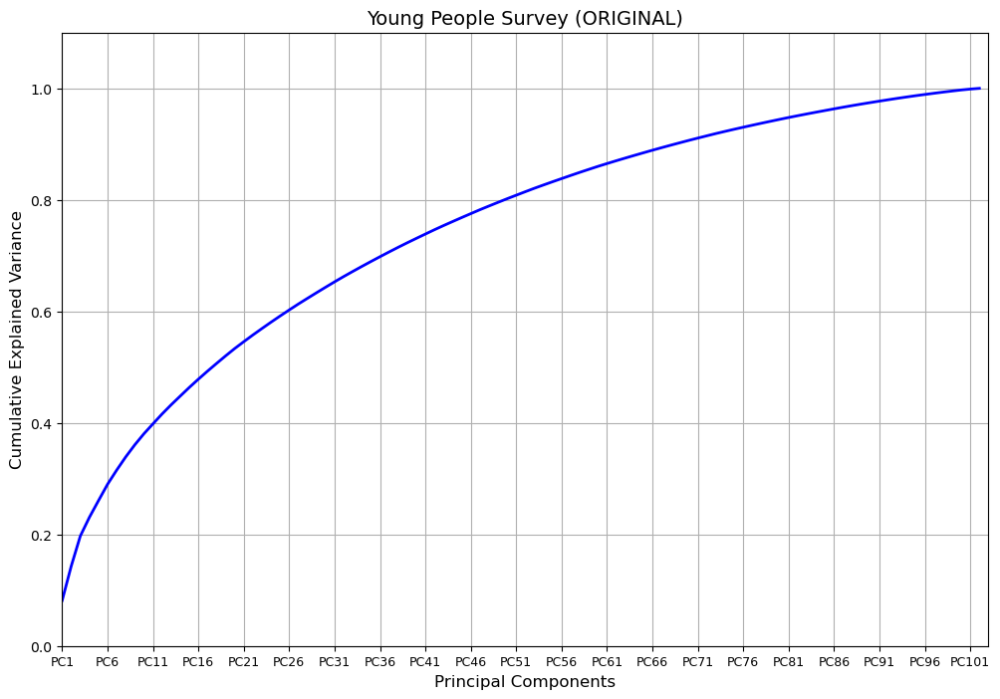

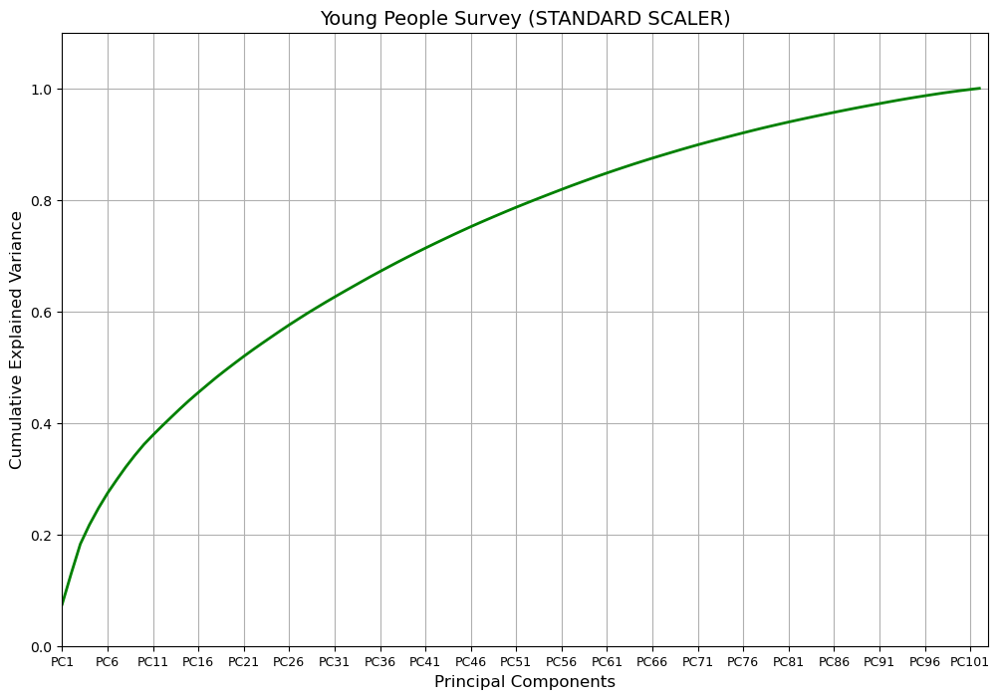

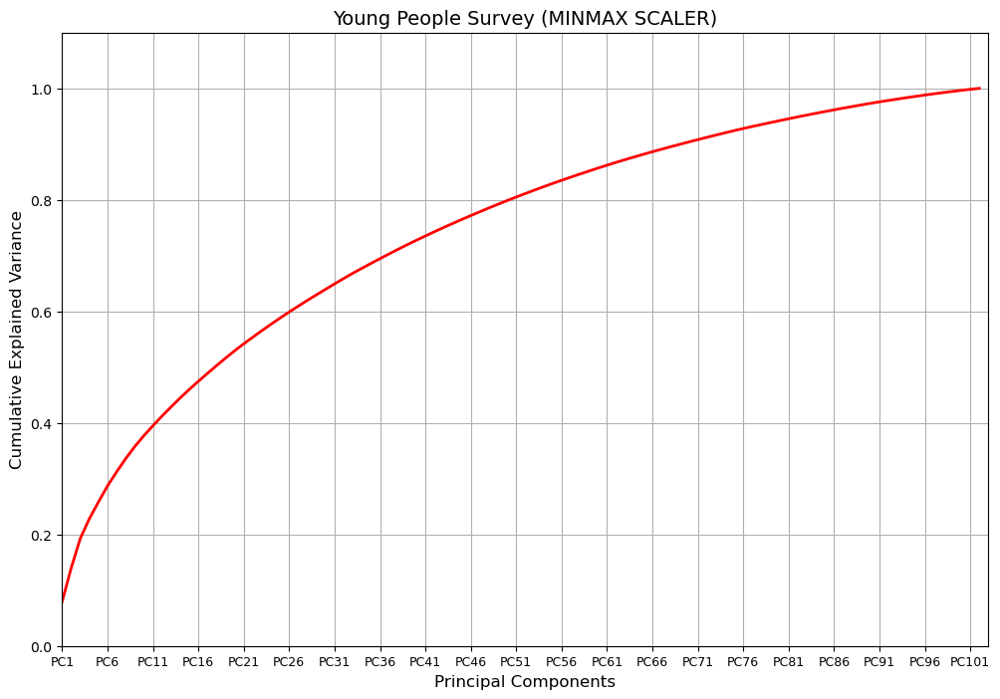

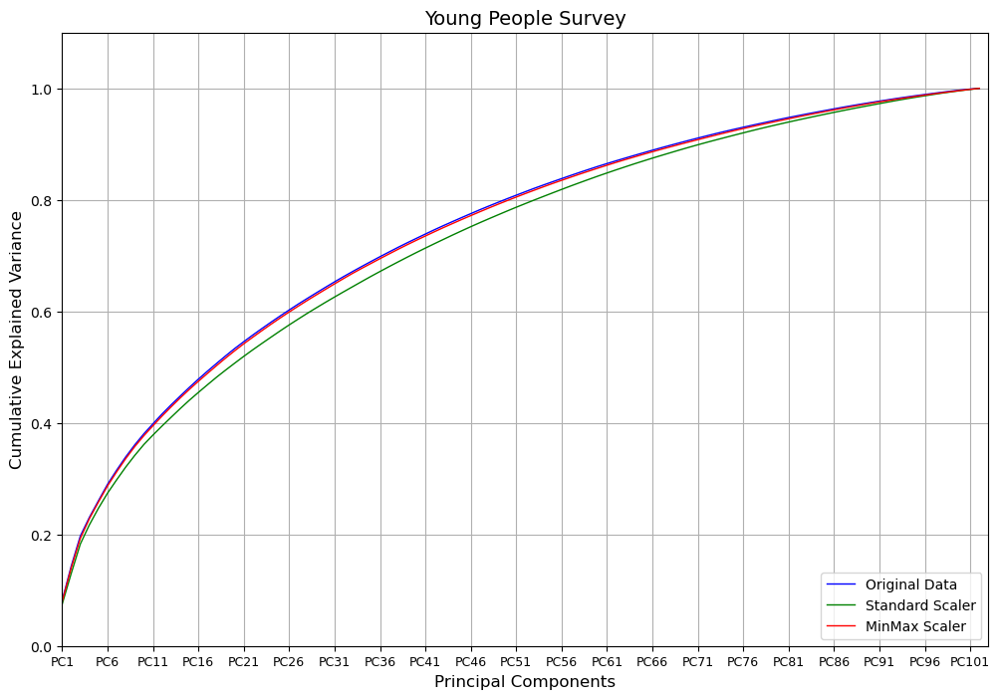

In [19]:
# PLOT FOR ORIGINAL
plt.figure(figsize=(12, 8))
plt.plot(np.cumsum(pca_original.explained_variance_ratio_), linewidth=2, color='blue') # (Exersize 2.3)
plt.title('Young People Survey (ORIGINAL)', fontsize=14)
plt.ylim([0, 1.1])
plt.xlim([0, 102])

# Display x-axis labels in increments of 5
plt.xticks(
    ticks=np.arange(0, pca_original.n_features_in_, step=5), 
    labels=[f'PC{i}' for i in range(1, pca_original.n_features_in_ + 1, 5)], fontsize=9)
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance', fontsize=12)
plt.grid()
plt.show()


# Plot for STANDARD SCALER
plt.figure(figsize=(12, 8))
plt.plot(np.cumsum(pca_std.explained_variance_ratio_), linewidth=2, color='green') # (Exersize 2.3)
plt.title('Young People Survey (STANDARD SCALER)', fontsize=14)
plt.ylim([0, 1.1])
plt.xlim([0, 102])

# Display x-axis labels in increments of 5
plt.xticks(
    ticks=np.arange(0, pca_std.n_features_in_, step=5), 
    labels=[f'PC{i}' for i in range(1, pca_std.n_features_in_ + 1, 5)], fontsize=9)
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance', fontsize=12)
plt.grid()
plt.show()


# Plot for MINMAX SCALER
plt.figure(figsize=(12, 8))
plt.plot(np.cumsum(pca_mm.explained_variance_ratio_), linewidth=2, color='red') # (Exersize 2.3)
plt.title('Young People Survey (MINMAX SCALER)', fontsize=14)
plt.ylim([0, 1.1])
plt.xlim([0, 102])

# Display x-axis labels in increments of 6
plt.xticks(
    ticks=np.arange(0, pca_mm.n_features_in_, step=5), 
    labels=[f'PC{i}' for i in range(1, pca_mm.n_features_in_ + 1, 5)], fontsize=9)
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance', fontsize=12)
plt.grid()
plt.show()


# All three at One
# Plot for ORIGINAL
plt.figure(figsize=(12, 8))
plt.plot(np.cumsum(pca_original.explained_variance_ratio_), label='Original Data', linewidth=1, color='blue') # (Exersize 2.3)

# Plot for STANDARD SCALER
plt.plot(np.cumsum(pca_std.explained_variance_ratio_), label='Standard Scaler', linewidth=1, color='green') # (Exersize 2.3)

# Plot for MINMAX SCALER
plt.plot(np.cumsum(pca_mm.explained_variance_ratio_), label='MinMax Scaler', linewidth=1, color='red') # (Exersize 2.3)

plt.title('Young People Survey', fontsize=14)

plt.ylim([0, 1.1])
plt.xlim([0, 102])

# Display x-axis labels in increments of 6
plt.xticks(
    ticks=np.arange(0, pca_mm.n_features_in_, step=5), 
    labels=[f'PC{i}' for i in range(1, pca_mm.n_features_in_ + 1, 5)], fontsize=9)
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Cumulative Explained Variance', fontsize=12)
plt.legend(loc='lower right') # Add legend
plt.grid()
plt.show()

### Observation for Cumulative Variance

- The **Standard Scaled** dataset (green) exhibits slightly lower explained variance compared to the **Original** (blue) and **MinMax Scaled** (red) datasets, particularly between **PC5 and PC75**.  
- The **Original** and **MinMax Scaled** datasets are nearly identical, indicating that MinMax scaling has minimal impact on the variance distribution.

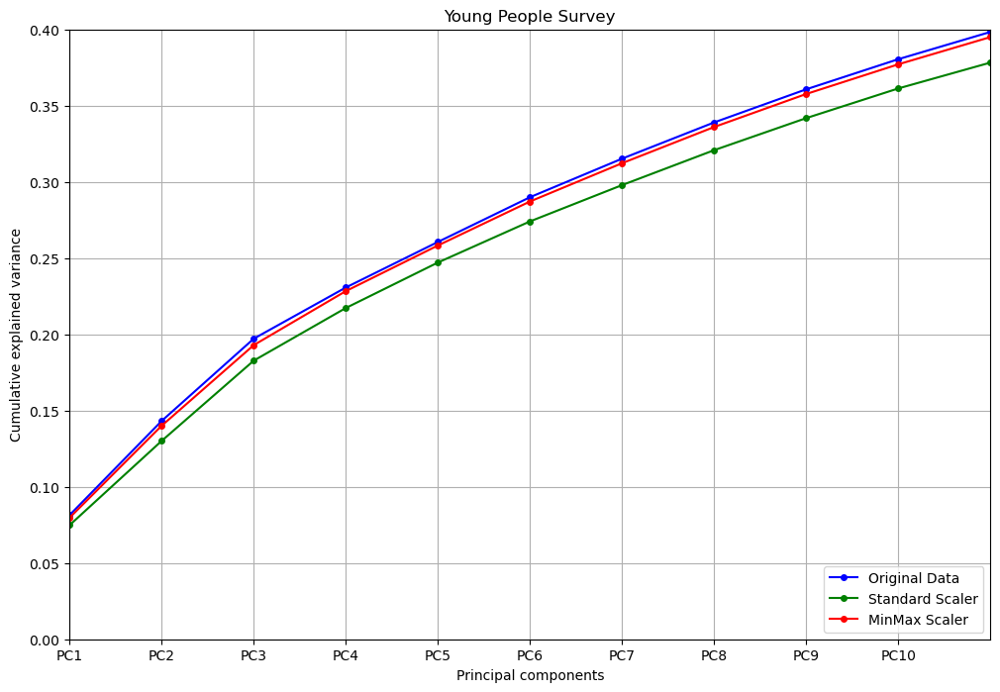

In [20]:
plt.figure(figsize=(12, 8))

# Plot cumulative explained variance for original data
plt.plot(np.cumsum(pca_original.explained_variance_ratio_), label='Original Data', color='blue', marker='o', markersize=4)

# Plot cumulative explained variance for standardized data
plt.plot(np.cumsum(pca_std.explained_variance_ratio_), label='Standard Scaler', color='green', marker='o', markersize=4)

# Plot cumulative explained variance for min-max scaled data
plt.plot(np.cumsum(pca_mm.explained_variance_ratio_), label='MinMax Scaler', color='red', marker='o', markersize=4)

# Customize the plot
plt.title('Young People Survey')
plt.ylim([0, 0.4])
plt.xlim([0, 10])
plt.xticks(ticks=np.arange(10), 
           labels=[f'PC{i + 1}' for i in range(10)])
plt.xlabel('Principal components')
plt.ylabel('Cumulative explained variance')
plt.grid()

# Add legend
plt.legend(loc='lower right')

# Show the combined plot
plt.show()

### Observation for First 10 PCs Cumulative Variance

- The **Standard Scaled** dataset (green) shows consistently lower cumulative variance compared to the **Original** (blue) and **MinMax Scaled** (red) datasets across the first 10 principal components.  
- The **Original** and **MinMax Scaled** datasets remain very close, with almost indistinguishable cumulative variance, indicating minimal effect of MinMax scaling.  
- This difference in the Standard Scaled dataset reflects a slight redistribution of variance, noticeable even in the early components.

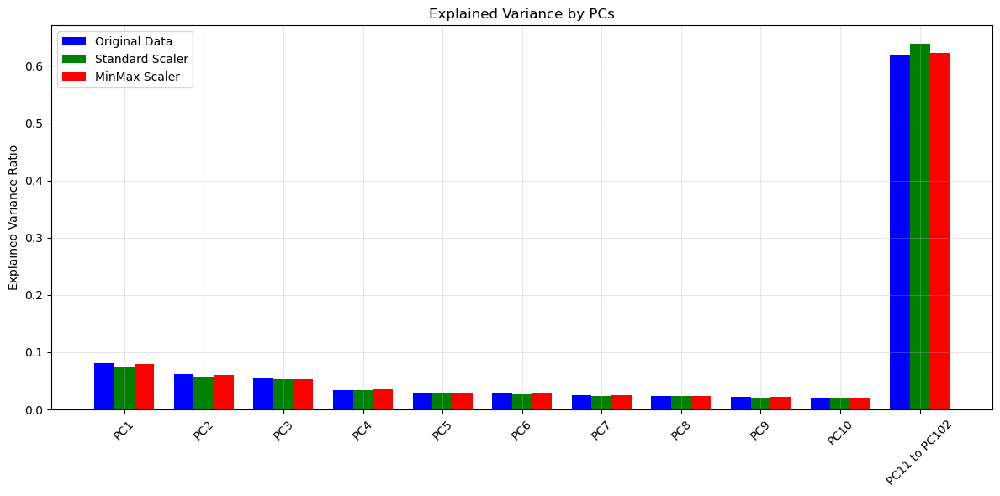

In [21]:
# Compute the explained variance for the first 10 PCs and group the rest
first_10_original = pca_original.explained_variance_ratio_[:10]
remaining_original = pca_original.explained_variance_ratio_[10:].sum()

first_10_std = pca_std.explained_variance_ratio_[:10] 
remaining_std = pca_std.explained_variance_ratio_[10:].sum()

first_10_mm = pca_mm.explained_variance_ratio_[:10]
remaining_mm = pca_mm.explained_variance_ratio_[10:].sum()

# Combine data for the bar plot
pc_labels = [f'PC{i+1}' for i in range(10)] + ['PC11 to PC102']
original_data = list(first_10_original) + [remaining_original]
std_data = list(first_10_std) + [remaining_std]
mm_data = list(first_10_mm) + [remaining_mm]

# Bar width for better spacing
bar_width = 0.25
x = np.arange(len(pc_labels))

# Plot the bar chart
plt.figure(figsize=(12, 6))
plt.bar(x - bar_width, original_data, width=bar_width, label='Original Data', color='blue')
plt.bar(x, std_data, width=bar_width, label='Standard Scaler', color='green')
plt.bar(x + bar_width, mm_data, width=bar_width, label='MinMax Scaler', color='red')

# Customize the plot
plt.xticks(x, pc_labels, rotation=45, fontsize=10)
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance by PCs')
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.tight_layout()
plt.show()

### Observation for Explained Variance by PCs

- The first 10 PCs capture most of the variance.  
- **Original** and **MinMax Scaled** datasets (blue and red) are nearly identical.  
- **Standard Scaled** (green) explains slightly less variance in the first few PCs.  
- Beyond PC10, variance contribution is minimal, with most variance concentrated in the top PCs.  

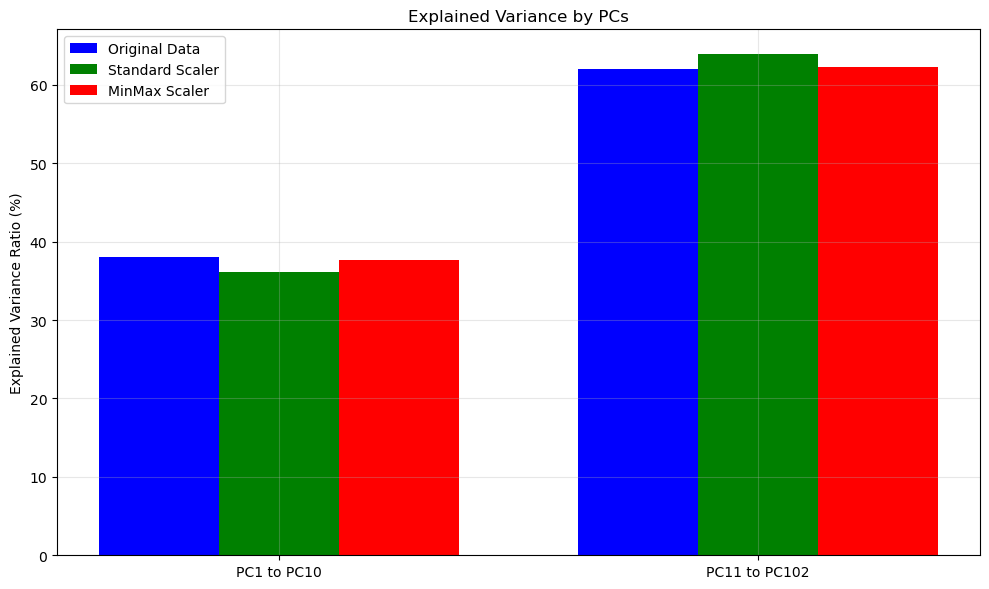

In [22]:
# Compute the explained variance for the first 10 PCs (grouped) and group the rest
first_10_original = pca_original.explained_variance_ratio_[:10].sum() * 100
remaining_original = pca_original.explained_variance_ratio_[10:].sum() * 100

first_10_std = pca_std.explained_variance_ratio_[:10].sum() * 100
remaining_std = pca_std.explained_variance_ratio_[10:].sum() * 100

first_10_mm = pca_mm.explained_variance_ratio_[:10].sum() * 100
remaining_mm = pca_mm.explained_variance_ratio_[10:].sum() * 100

# Labels for the bar plot
pc_labels = ['PC1 to PC10', 'PC11 to PC102']
original_data = [first_10_original, remaining_original]
std_data = [first_10_std, remaining_std]
mm_data = [first_10_mm, remaining_mm]

# Bar width for better spacing
bar_width = 0.25
x = np.arange(len(pc_labels))  # Positions for the grouped bars

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(x - bar_width, original_data, width=bar_width, label='Original Data', color='blue')
plt.bar(x, std_data, width=bar_width, label='Standard Scaler', color='green')
plt.bar(x + bar_width, mm_data, width=bar_width, label='MinMax Scaler', color='red')

# Customize the plot
plt.xticks(x, pc_labels, fontsize=10)
plt.ylabel('Explained Variance Ratio (%)')
plt.title('Explained Variance by PCs')
plt.legend()
plt.grid(alpha=0.3)

# Show the plot
plt.tight_layout()
plt.show()

### Observation:

Approximately **40%** of the variance is captured by the first 10 PCs (PC1 to PC10), while the remaining **60%** is spread across the rest (PC11 to PC102). The Original and MinMax Scaled datasets exhibit nearly identical distributions, while the Standard Scaled dataset has slightly less variance in the first 10 PCs and more distributed across the rest.

In [23]:
print(f'5 MINMAX PCs = {pca_mm.explained_variance_ratio_[:5].sum() * 100:.2f}%')
print(f'5 STANDARD PCs = {pca_std.explained_variance_ratio_[:5].sum() * 100:.2f}%')
print(f'5 ORIGINAL PCs = {pca_original.explained_variance_ratio_[:5].sum() * 100:.2f}%')
print('')
print(f'8 MINMAX PCs = {pca_mm.explained_variance_ratio_[:8].sum() * 100:.2f}%')
print(f'9 STANDARD PCs = {pca_std.explained_variance_ratio_[:9].sum() * 100:.2f}%')
print(f'8 ORIGINAL PCs = {pca_original.explained_variance_ratio_[:8].sum() * 100:.2f}%')

5 MINMAX PCs = 25.83%
5 STANDARD PCs = 24.71%
5 ORIGINAL PCs = 26.06%

8 MINMAX PCs = 33.60%
9 STANDARD PCs = 34.18%
8 ORIGINAL PCs = 33.90%


### Observation:

- The first **5 PCs** account for `~25-26%` of the variance across all datasets.  
- The first **8 PCs** account for `~33-34%` of the variance across **Original** and **MinMax Scaled** datasets.  
- For **Standard Scaled** dataset, **9 PCs** are required to reach a similar explained variance level as the other datasets with 8 PCs.

In [24]:
print(f'3 MINMAX PCs (3D) = {pca_mm.explained_variance_ratio_[:3].sum() * 100:.2f}%')
print(f'3 STANDARD PCs (3D) = {pca_std.explained_variance_ratio_[:3].sum() * 100:.2f}%')
print(f'3 ORIGINAL PCs (3D) = {pca_original.explained_variance_ratio_[:3].sum() * 100:.2f}%')
print('')
print(f'2 MINMAX PCs (2D) = {pca_mm.explained_variance_ratio_[:2].sum() * 100:.2f}%')
print(f'2 STANDARD PCs (2D) = {pca_std.explained_variance_ratio_[:2].sum() * 100:.2f}%')
print(f'2 ORIGINAL PCs (2D) = {pca_original.explained_variance_ratio_[:2].sum() * 100:.2f}%')

3 MINMAX PCs (3D) = 19.29%
3 STANDARD PCs (3D) = 18.28%
3 ORIGINAL PCs (3D) = 19.71%

2 MINMAX PCs (2D) = 14.01%
2 STANDARD PCs (2D) = 13.01%
2 ORIGINAL PCs (2D) = 14.32%


### Observation:

- The first **3 PCs**, suitable for **3D visualization**, account for `~18-20%` of the variance across all datasets.
- The first **2 PCs**, suitable for **2D visualization**, account for `~13-15%` of the variance across all datasets.

## Types & Categories

Before proceeding to the next exercise, we create two dataframes to enhance the visualization and understanding of Principal Component (PC) contributions:

1. **Types DataFrame**: Maps each feature to its type, along with a corresponding color for better clarity.  
   *(Structure: Feature — Type — Color)*  

2. **Categories DataFrame**: Maps each feature to its broader category, with an associated color for intuitive grouping.  
   *(Structure: Feature — Category — Color)*  

This preparation ensures a more effective and visually appealing analysis of PC contributions.

### Explanation of Types and Categories

We mapped features to their respective types (e.g., `Personality`, `Music`) and grouped these types into broader categories:
- **Entertainment**: Includes `Music`, `Movies`, and `Interests`.
- **Personality**: Covers `Health`, `Phobias`, `Finance`, etc.
- **Demographics**: Treated as a standalone category.

### Adding Colors

Each type and category is assigned a unique color to enhance future visualizations, making it easier to differentiate contributions.

### Purpose

This setup is for visualizing feature contributions (e.g., to PC1) by types and categories. Colors highlight patterns, enabling easier comparison and analysis across both granular types and broader categories.

In [25]:
# Step 1: Create a mapping of features to their types
# Map each feature to its corresponding type using the 'variables_by_type' dictionaryfeature_to_type = {}
feature_to_type = {
    feature: type_  # Assign the feature to its respective type
    for type_, features in variables_by_type.items()  # Loop through all types and their associated features
    for feature in features  # Loop through each feature under the type
}

# Step 2: Create a mapping of types to their categories
# Define broader categories and map feature types to these categories
categories = {
    'Entertainment': ['Music', 'Movies', 'Interests'],  # Entertainment includes these types
    'Personality': ['Phobias', 'Health', 'Personality', 'Finance'],  # Personality includes these types
    'Demographics': ['Demographics']  # Demographics as a standalone category
}

# Create a reverse mapping to link each type to its respective category
type_to_category = {
    type_: category  # Assign the type to its category
    for category, types in categories.items()  # Loop through each category and its associated types
    for type_ in types  # Loop through each type in the category
}

# Step 3: Map features to categories via their types
# Use the previously created mappings to assign each feature to a broader category
feature_to_category = {
    feature: type_to_category[feature_to_type[feature]]  # Get the category for the feature's type
    for feature in these_features  # Loop through the provided features
}


# Step 4: Create the DataFrame for types
# Create a DataFrame that maps each feature to its type
types_df = pd.DataFrame({
    'Feature': these_features, # List of features
    'Type': [feature_to_type[feature] for feature in these_features] # Map each feature to its type
})

# Step 5: Create the DataFrame for categories
# Create a DataFrame that maps each feature to its category
cats_df = pd.DataFrame({
    'Feature': these_features, # List of features
    'Category': [feature_to_category[feature] for feature in these_features] # Map each feature to its category
})

In [26]:
# Display type DataFrame
print("types_df:")
display(types_df)

# Display category DataFrame
print("cats_df:")
display(cats_df)

types_df:


,Feature,Type
0,Health,Personality
1,Friends versus money,Personality
2,Hypochondria,Personality
3,Criminal damage,Personality
4,Energy levels,Personality
...,...,...
97,Rock n roll,Music
98,Alternative,Music
99,Latino,Music
100,"Techno, Trance",Music


cats_df:


,Feature,Category
0,Health,Personality
1,Friends versus money,Personality
2,Hypochondria,Personality
3,Criminal damage,Personality
4,Energy levels,Personality
...,...,...
97,Rock n roll,Entertainment
98,Alternative,Entertainment
99,Latino,Entertainment
100,"Techno, Trance",Entertainment


## Adding Colors to `types_df` and `cats_df` 

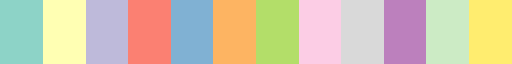

In [27]:
# SAVE THE COLORS OF Set3 AS A LIST OF RGB TUPLES "(red_value, green_value, blue_value)"
# This will be used to assign colors to each type and category
set3 = cm.Set3.colors

# ######### SHOWING THE COLORS OF THE CHOSEN COLORMAP #########
# Display the Set3 colormap to preview the available colors
display(cm.Set3)
# #############################################################

# ASSIGN COLORS TO EACH FEATURE TYPE
# Mapping specific RGB colors from Set3 to feature types
type_colors = {
    'Personality': set3[0],  # First color for Personality
    'Health': set3[1],       # Second color for Health
    'Phobias': set3[2],      # Third color for Phobias
    'Interests': set3[3],    # Fourth color for Interests
    'Music': set3[4]         # Fifth color for Music
}

# ASSIGN COLORS TO EACH FEATURE CATEGORY
# Mapping specific RGB colors from Set3 to broader feature categories
cat_colors = {
    'Entertainment': set3[5],  # Sixth color for Entertainment
    'Personality': set3[6],    # Seventh color for Personality
    'Demographics': set3[7]    # Eighth color for Demographics
}

# ADDING A 'Color' COLUMN TO THE TYPES DATAFRAME
# Map the color corresponding to each feature type
types_df['Color'] = types_df['Type'].map(type_colors) 

# ADDING A 'Color' COLUMN TO THE CATEGORIES DATAFRAME
# Map the color corresponding to each feature category
cats_df['Color'] = cats_df['Category'].map(cat_colors)

In [28]:
# DISPLAY THE UPDATED DATAFRAMES
# Display the DataFrame with the added 'Color' column for types
display(types_df)

# Display the DataFrame with the added 'Color' column for categories
display(cats_df) 

,Feature,Type,Color
0,Health,Personality,"(0.5529411764705883, 0.8274509803921568, 0.780..."
1,Friends versus money,Personality,"(0.5529411764705883, 0.8274509803921568, 0.780..."
2,Hypochondria,Personality,"(0.5529411764705883, 0.8274509803921568, 0.780..."
3,Criminal damage,Personality,"(0.5529411764705883, 0.8274509803921568, 0.780..."
4,Energy levels,Personality,"(0.5529411764705883, 0.8274509803921568, 0.780..."
...,...,...,...
97,Rock n roll,Music,"(0.5019607843137255, 0.6941176470588235, 0.827..."
98,Alternative,Music,"(0.5019607843137255, 0.6941176470588235, 0.827..."
99,Latino,Music,"(0.5019607843137255, 0.6941176470588235, 0.827..."
100,"Techno, Trance",Music,"(0.5019607843137255, 0.6941176470588235, 0.827..."


,Feature,Category,Color
0,Health,Personality,"(0.7019607843137254, 0.8705882352941177, 0.411..."
1,Friends versus money,Personality,"(0.7019607843137254, 0.8705882352941177, 0.411..."
2,Hypochondria,Personality,"(0.7019607843137254, 0.8705882352941177, 0.411..."
3,Criminal damage,Personality,"(0.7019607843137254, 0.8705882352941177, 0.411..."
4,Energy levels,Personality,"(0.7019607843137254, 0.8705882352941177, 0.411..."
...,...,...,...
97,Rock n roll,Entertainment,"(0.9921568627450981, 0.7058823529411765, 0.384..."
98,Alternative,Entertainment,"(0.9921568627450981, 0.7058823529411765, 0.384..."
99,Latino,Entertainment,"(0.9921568627450981, 0.7058823529411765, 0.384..."
100,"Techno, Trance",Entertainment,"(0.9921568627450981, 0.7058823529411765, 0.384..."


## Exercise 3. Dimensionality Reduction and PC Interpretation

In the cells below, do the following operations:
1. For each one of the two dataframes _Xstd_df_, and _Xmm_df_, compute a new PCA for performing a dimensionality reduction with respect to $m$ dimensions. The value of $m$ must be $$m = \min\{m', 5\}\,,$$ where $m'$ is the value required for obtaining $33\%$ of the total variance.
2. For both the cases, visualize all the PCs and give a name/interpretation to them. **Comment and motivate your interpretations**. If possible, **compare the differences among the results obtained** for _Xstd_df_ and _Xmm_df_.
3. Perform the score graph for both the cases (_std_ and _mm_). If $m>3$, plot the score graph with respect to the first 3 PCs. All the **plots must show the names of the PCs on the axes** for better understanding the results.
4. **Optional:** plot more score graphs, coloring the dots with respect to any label in the list _labels_ that you believe can be interesting. **Comment and analyze this optional plots**.

### Dimensionality Reduction with PCA for Xstd_df and Xmm_df

In this step, we compute a new PCA for dimensionality reduction, limiting the components to `m` dimensions. The value of `m` is determined as the minimum of:

- The number of components required to explain **33% of the total variance**, denoted as \( m' \).
- A fixed value of 5.

For the given datasets:
- **MinMax Scaler (`Xmm_df`)**: \( m' \) is 8, but \( m = 5 \) (limited to 5).
- **Standard Scaler (`Xstd_df`)**: \( m' \) is 9, but \( m = 5 \) (limited to 5).

In [29]:
# m' is 8 for MinMaxScaler and 9 for StandardScaler (33%)
m = 5

# PCA Initialization with 5 components
pca_std_m = PCA(svd_solver="full", n_components=m) # Exercise 3.1
pca_mm_m = PCA(svd_solver="full", n_components=m) # Exercise 3.1

# Fit the Datasetes
pca_std_m.fit(Xstd_df)
pca_mm_m.fit(Xmm_df)

PCA(n_components=5, svd_solver='full')

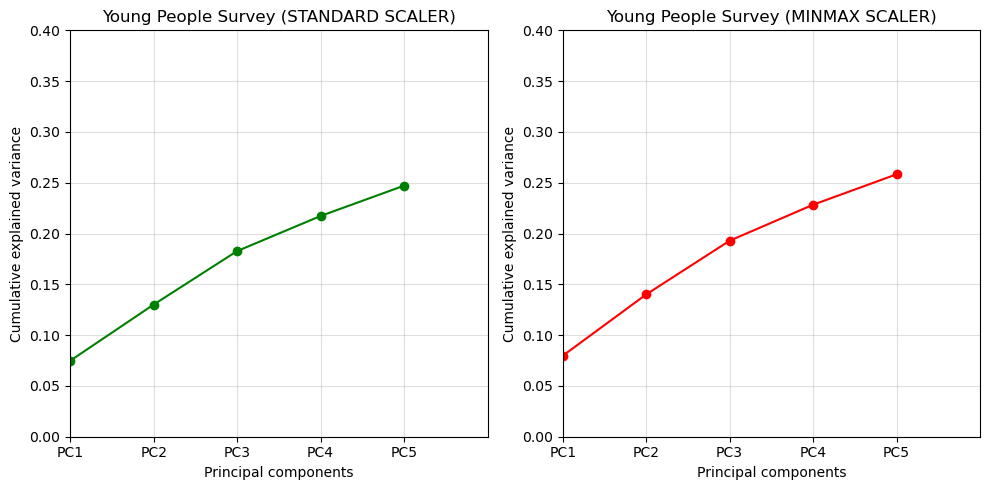

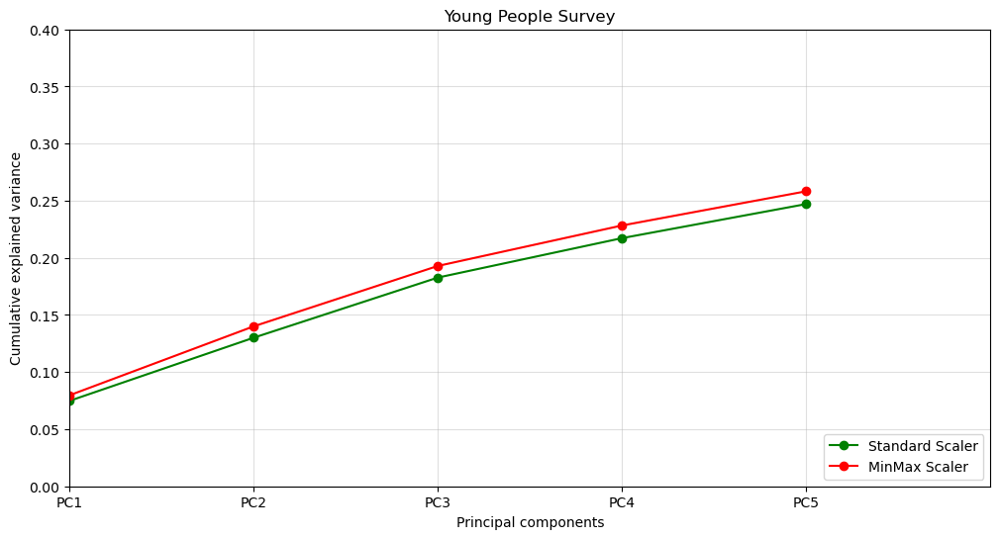

In [30]:
# Create a figure with two subplots in one row
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# First subplot: Standard Scaler
axes[0].plot(np.cumsum(pca_std_m.explained_variance_ratio_), color='green', marker='o')
axes[0].set_title('Young People Survey (STANDARD SCALER)')
axes[0].set_ylim([0, 0.4])
axes[0].set_xlim([0, 5])
axes[0].set_xticks(np.arange(pca_std_m.n_components))
axes[0].set_xticklabels([f'PC{i + 1}' for i in range(pca_std_m.n_components)])
axes[0].set_xlabel('Principal components')
axes[0].set_ylabel('Cumulative explained variance')
axes[0].grid(alpha=0.4)

# Second subplot: MinMax Scaler
axes[1].plot(np.cumsum(pca_mm_m.explained_variance_ratio_), color='red', marker='o')
axes[1].set_title('Young People Survey (MINMAX SCALER)')
axes[1].set_ylim([0, 0.4])
axes[1].set_xlim([0, 5])
axes[1].set_xticks(np.arange(pca_mm_m.n_components))
axes[1].set_xticklabels([f'PC{i + 1}' for i in range(pca_mm_m.n_components)])
axes[1].set_xlabel('Principal components')
axes[1].set_ylabel('Cumulative explained variance')
axes[1].grid(alpha=0.4)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()



plt.figure(figsize=(12, 6))

# Plot cumulative explained variance for standardized data
plt.plot(np.cumsum(pca_std_m.explained_variance_ratio_), label='Standard Scaler', color='green', marker='o')

# Plot cumulative explained variance for min-max scaled data
plt.plot(np.cumsum(pca_mm_m.explained_variance_ratio_), label='MinMax Scaler', color='red', marker='o')

# Customize the plot
plt.title('Young People Survey')
plt.ylim([0, 0.4])
plt.xlim([0, 5])
plt.xticks(ticks=np.arange(m), 
           labels=[f'PC{i + 1}' for i in range(m)])
plt.xlabel('Principal components')
plt.ylabel('Cumulative explained variance')
plt.grid(alpha=0.4)

# Add legend
plt.legend(loc='lower right')

# Show the combined plot
plt.show()

### Cumulative Explained Variance: Standard vs. MinMax Scaler

**Key Insights**:  (as we said earlier)
- For **2D visualization**, approximately **14% of the variance** is captured across the first 2 PCs for both scalers.  
- For **3D visualization**, about **19% of the variance** is captured across the first 3 PCs.  
- The **Standard Scaler** consistently captures slightly **lower variance** compared to the **MinMax Scaler**. However, the differences remain minimal.

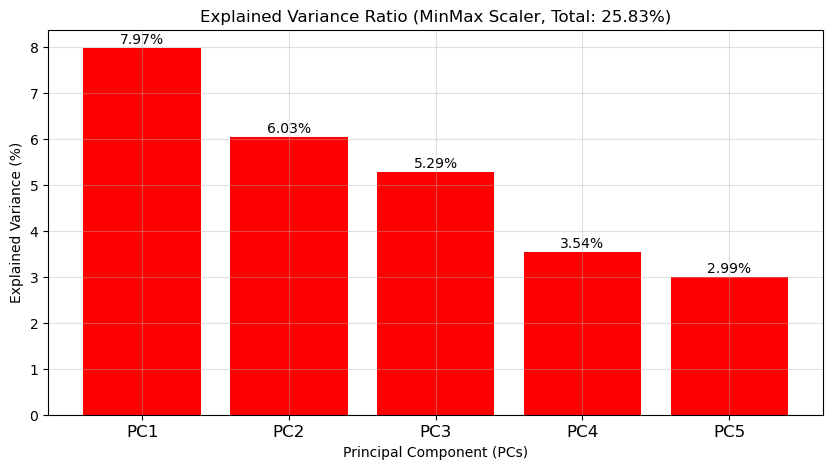

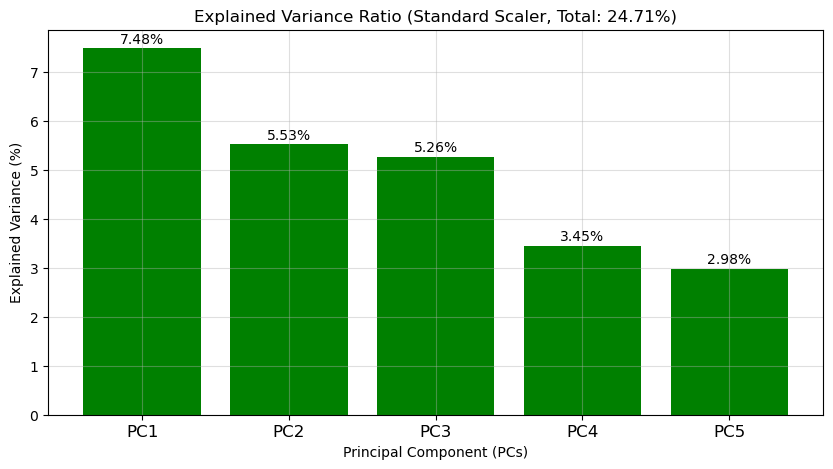

In [31]:
# Plot explained variance ratio for MinMax Scaler
plt.figure(figsize=(10, 5))

# Calculate the explained variance ratios and their total
explained_variances_mm = pca_mm_m.explained_variance_ratio_ * 100  # Convert to percentage
total_explained_variance_mm = explained_variances_mm.sum()

# Create bar plot for MinMax Scaler
plt.bar(range(1, m + 1), explained_variances_mm, color='red')
plt.title(f'Explained Variance Ratio (MinMax Scaler, Total: {total_explained_variance_mm:.2f}%)')
plt.xlabel('Principal Component (PCs)')
plt.ylabel('Explained Variance (%)')
plt.xticks(range(1, pca_mm_m.n_components + 1), labels=[f'PC{i}' for i in range(1, pca_mm_m.n_components + 1)], fontsize=12)

# Annotate each bar with its variance percentage
for i, variance in enumerate(explained_variances_mm, start=1):
    plt.text(i, variance + 0.1, f'{variance:.2f}%', ha='center', fontsize=10)

plt.grid(alpha=0.4)
plt.show()

# Plot explained variance ratio for Standard Scaler
plt.figure(figsize=(10, 5))

# Calculate the explained variance ratios and their total
explained_variances_std = pca_std_m.explained_variance_ratio_ * 100  # Convert to percentage
total_explained_variance_std = explained_variances_std.sum()

# Create bar plot for Standard Scaler
plt.bar(range(1, m + 1), explained_variances_std, color='green')
plt.title(f'Explained Variance Ratio (Standard Scaler, Total: {total_explained_variance_std:.2f}%)')
plt.xlabel('Principal Component (PCs)')
plt.ylabel('Explained Variance (%)')
plt.xticks(range(1, pca_std_m.n_components + 1), labels=[f'PC{i}' for i in range(1, pca_std_m.n_components + 1)], fontsize=12)

# Annotate each bar with its variance percentage
for i, variance in enumerate(explained_variances_std, start=1):
    plt.text(i, variance + 0.1, f'{variance:.2f}%', ha='center', fontsize=10)

plt.grid(alpha=0.4)
plt.show()


## PC Interpretation

Let's have a look at the contribute of the original features to the PCs for both Standard Scaled and MinMax Scaled datasets.

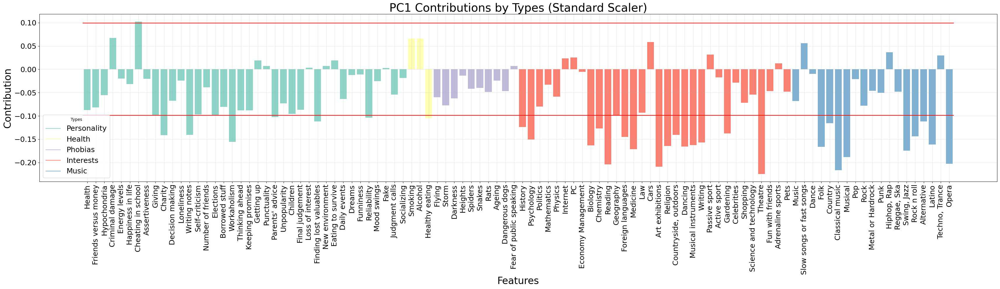

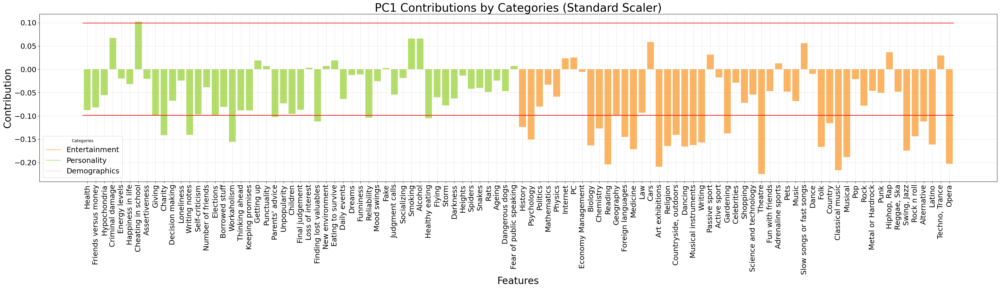


****************** PC1 **********************
HIGH-VALUED POSITIVE COMPONENTS (TYPES): ['Cheating in school']
HIGH-VALUED NEGATIVE COMPONENTS (TYPES): ['Theatre', 'Classical music', 'Art exhibitions', 'Reading', 'Opera', 'Musical', 'Swing, Jazz', 'Medicine', 'Folk', 'Dancing', 'Religion', 'Biology', 'Musical instruments', 'Latino', 'Writing', 'Workaholism', 'Psychology', 'Foreign languages', 'Rock n roll', 'Charity', 'Writing notes', 'Countryside, outdoors', 'Gardening', 'Chemistry', 'History', 'Country', 'Alternative', 'Finding lost valuables', 'Healthy eating', 'Reliability', "Parents' advice", 'Giving']

HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): ['Cheating in school']
HIGH-VALUED NEGATIVE COMPONENTS (CATEGORIES): ['Theatre', 'Classical music', 'Art exhibitions', 'Reading', 'Opera', 'Musical', 'Swing, Jazz', 'Medicine', 'Folk', 'Dancing', 'Religion', 'Biology', 'Musical instruments', 'Latino', 'Writing', 'Workaholism', 'Psychology', 'Foreign languages', 'Rock n roll', 'Charity',

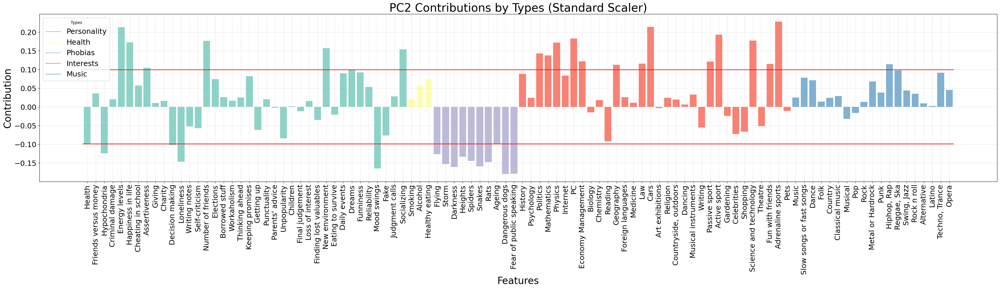

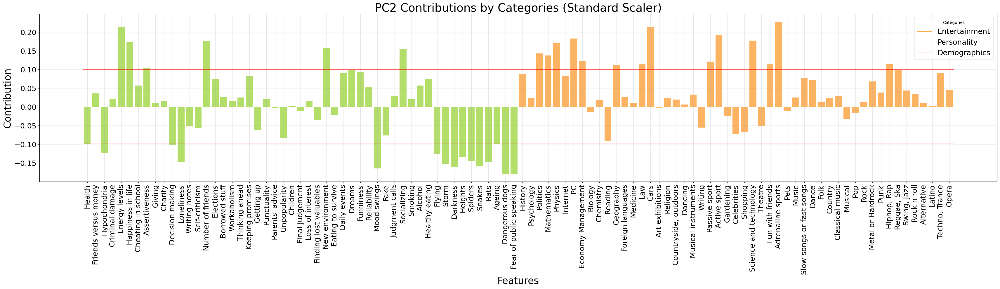


****************** PC2 **********************
HIGH-VALUED POSITIVE COMPONENTS (TYPES): ['Adrenaline sports', 'Cars', 'Energy levels', 'Active sport', 'PC', 'Science and technology', 'Number of friends', 'Happiness in life', 'Physics', 'New environment', 'Socializing', 'Politics', 'Mathematics', 'Economy Management', 'Passive sport', 'Law', 'Fun with friends', 'Hiphop, Rap', 'Geography', 'Assertiveness']
HIGH-VALUED NEGATIVE COMPONENTS (TYPES): ['Dangerous dogs', 'Fear of public speaking', 'Mood swings', 'Darkness', 'Snakes', 'Storm', 'Rats', 'Loneliness', 'Spiders', 'Heights', 'Flying', 'Hypochondria', 'Decision making', 'Ageing']

HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): ['Adrenaline sports', 'Cars', 'Energy levels', 'Active sport', 'PC', 'Science and technology', 'Number of friends', 'Happiness in life', 'Physics', 'New environment', 'Socializing', 'Politics', 'Mathematics', 'Economy Management', 'Passive sport', 'Law', 'Fun with friends', 'Hiphop, Rap', 'Geography', 'Assertive

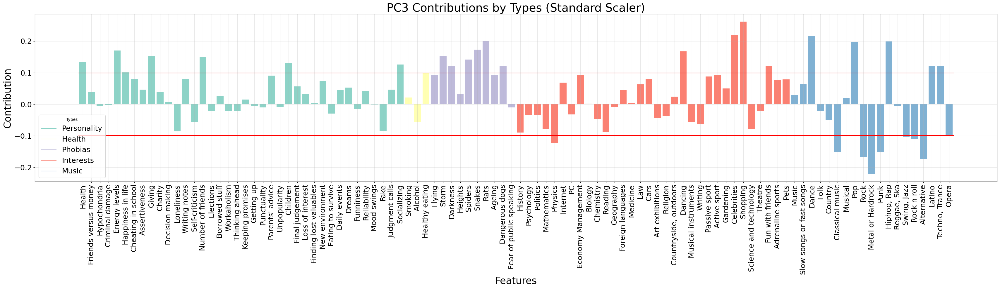

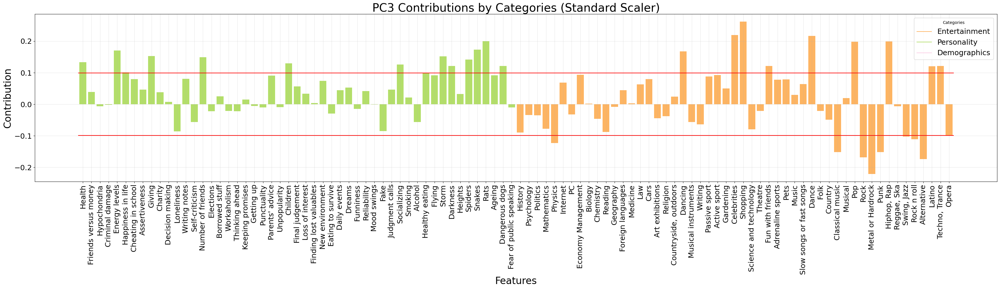


****************** PC3 **********************
HIGH-VALUED POSITIVE COMPONENTS (TYPES): ['Shopping', 'Celebrities', 'Dance', 'Rats', 'Hiphop, Rap', 'Pop', 'Snakes', 'Energy levels', 'Dancing', 'Giving', 'Storm', 'Number of friends', 'Spiders', 'Health', 'Children', 'Socializing', 'Dangerous dogs', 'Fun with friends', 'Darkness', 'Techno, Trance', 'Latino', 'Happiness in life']
HIGH-VALUED NEGATIVE COMPONENTS (TYPES): ['Metal or Hardrock', 'Alternative', 'Rock', 'Classical music', 'Punk', 'Physics', 'Rock n roll', 'Swing, Jazz']

HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): ['Shopping', 'Celebrities', 'Dance', 'Rats', 'Hiphop, Rap', 'Pop', 'Snakes', 'Energy levels', 'Dancing', 'Giving', 'Storm', 'Number of friends', 'Spiders', 'Health', 'Children', 'Socializing', 'Dangerous dogs', 'Fun with friends', 'Darkness', 'Techno, Trance', 'Latino', 'Happiness in life']
HIGH-VALUED NEGATIVE COMPONENTS (CATEGORIES): ['Metal or Hardrock', 'Alternative', 'Rock', 'Classical music', 'Punk', 'Physics'

In [32]:
# DEFINE EPSILON
# Epsilon is a threshold used to identify significant contributions in the PCA components.
eps = np.sqrt(1 / pca_std_m.n_features_in_)

# DEFINE COLORS FOR SKILL TYPES AND CATEGORIES
# Extract the color column from the dataframes for types and categories
colors_type = types_df.loc[:, 'Color']  
colors_cat = cats_df.loc[:, 'Color']  

# CREATE LEGENDS FOR TYPES AND CATEGORIES
# Generate custom legends for types and categories using their respective colors
type_colors_legend = [Line2D([0], [0], color=type_colors[k]) for k in type_colors.keys()]
cat_colors_legend = [Line2D([0], [0], color=cat_colors[k]) for k in cat_colors.keys()]

# LOOP THROUGH THE FIRST 3 PRINCIPAL COMPONENTS
# For each of the first 3 PCs, generate bar plots for contributions by types and categories
for ii in range(3):
    # Get PCA components for the current principal component
    pc_components = pca_std_m.components_[ii]
    
    # BAR PLOT FOR TYPES
    plt.figure(figsize=(34, 10))
    plt.bar(range(len(pc_components)), pc_components, color=colors_type)
    plt.plot([-0.5, len(pc_components) - 0.5], [eps, eps], 'red', label='Epsilon Threshold')  # Positive threshold
    plt.plot([-0.5, len(pc_components) - 0.5], [-eps, -eps], 'red')  # Negative threshold
    plt.title(f'PC{ii+1} Contributions by Types (Standard Scaler)', fontsize=28)
    plt.xlabel('Features', fontsize=24)
    plt.ylabel('Contribution', fontsize=24)
    plt.legend(type_colors_legend, type_colors.keys(), title='Types', fontsize=18)  # Add custom legend
    plt.xticks(range(len(pc_components)), types_df['Feature'], rotation=90, fontsize=18)  # Feature names as x-axis labels
    plt.tight_layout()
    plt.tick_params(axis='y', labelsize=18)
    plt.grid(alpha=0.3)  # Add grid for better visualization
    plt.show()
    
    # BAR PLOT FOR CATEGORIES
    plt.figure(figsize=(34, 10))
    plt.bar(range(len(pc_components)), pc_components, color=colors_cat)
    plt.plot([-0.5, len(pc_components) - 0.5], [eps, eps], 'red', label='Epsilon Threshold')  # Positive threshold
    plt.plot([-0.5, len(pc_components) - 0.5], [-eps, -eps], 'red')  # Negative threshold
    plt.title(f'PC{ii+1} Contributions by Categories (Standard Scaler)', fontsize=28)
    plt.xlabel('Features', fontsize=24)
    plt.ylabel('Contribution', fontsize=24)
    plt.legend(cat_colors_legend, cat_colors.keys(), title='Categories', fontsize=18)  # Add custom legend
    plt.xticks(range(len(pc_components)), cats_df['Feature'], rotation=90, fontsize=18)  # Feature names as x-axis labels
    plt.tight_layout()
    plt.tick_params(axis='y', labelsize=18)
    plt.grid(alpha=0.3)  # Add grid for better visualization
    plt.show()
    
    # IDENTIFY SIGNIFICANT COMPONENTS
    # Sort components to identify features with high positive and negative contributions
    sorted_positive_types = [
        types_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1], reverse=True) if value > eps
    ]
    sorted_negative_types = [
        types_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1]) if value < -eps
    ]
    
    sorted_positive_cats = [
        cats_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1], reverse=True) if value > eps
    ]
    sorted_negative_cats = [
        cats_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1]) if value < -eps
    ]
    
    # PRINT SIGNIFICANT FEATURES
    # Display features with significant positive and negative contributions for types and categories
    print('')
    print(f'****************** PC{ii+1} **********************')
    print(f'HIGH-VALUED POSITIVE COMPONENTS (TYPES): {sorted_positive_types}')
    print(f'HIGH-VALUED NEGATIVE COMPONENTS (TYPES): {sorted_negative_types}')
    print('')
    print(f'HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): {sorted_positive_cats}')
    print(f'HIGH-VALUED NEGATIVE COMPONENTS (CATEGORIES): {sorted_negative_cats}')
    print('*********************************************')
    print('')


### Observations and Interpretations for Standard Scaled Dataset (PC1, PC2, PC3)

---

### **PC1 (Principal Component 1)**

- **Positive Contributions**:  
  Strongly linked to cultural and intellectual engagement, with features like *Theatre*, *Classical Music*, *Art Exhibitions*, and *Opera*.  
  Personality traits such as *Workaholism*, *Reliability*, and *Giving* emphasize responsibility, ethical values, and a focus on meaningful contributions.  

- **Negative Contributions**:  
  The sole significant negative contribution, *Cheating in School*, represents rule-breaking behavior that directly contrasts with the cultural, intellectual, and ethical focus of the positive traits.  

- **Interpretation**:  
  PC1 reflects a spectrum between **Rule Breaker (-)**, reflecting ethical disregard and academic dishonesty, and **Cultural & Intellectual Enthusiast (+)**, prioritizing creativity, responsibility, and intellectual curiosity.

---

### **PC2 (Principal Component 2)**

- **Positive Contributions**:  
  Features such as *Adrenaline Sports*, *Socializing*, *Happiness in Life*, and *Energy Levels* indicate an adventurous, energetic, and socially confident personality.  
  Intellectual pursuits, including *Physics*, *Mathematics*, and *Economy Management*, highlight logical thinking and curiosity.  

- **Negative Contributions**:  
  Traits like *Fear of Public Speaking*, *Snakes*, *Storm*, and *Heights* reflect fear and emotional sensitivity, emphasizing a cautious and risk-averse personality.

- **Interpretation**:  
  PC2 distinguishes between **Fearful & Hesitant (-)**, marked by emotional sensitivity and risk aversion, and **Socially Confident & Energetic (+)**, characterized by adventurousness, confidence, and intellectual curiosity.

---

### **PC3 (Principal Component 3)**

- **Positive Contributions**:  
  Features such as *Shopping*, *Celebrities*, *Pop Music*, and *Socializing* highlight a socially vibrant, trendy, and leisure-oriented personality.  
  Traits like *Energy Levels* and *Happiness in Life* further reflect enthusiasm and a love for contemporary, expressive lifestyles.

- **Negative Contributions**:  
  Music preferences such as *Metal or Hardrock*, *Punk*, *Rock*, and *Alternative* indicate alignment with countercultural, individualistic, and introspective tendencies.  
  These traits contrast with the lighthearted, mainstream behaviors of the positive contributors.

- **Interpretation**:  
  PC3 highlights a contrast between **Metalhead & Classic Music Enthusiast (-)**, reflecting introspective, countercultural music preferences, and **Vibrant & Trendy & Fearful (+)**, emphasizing socially vibrant, trendy, and contemporary lifestyles with some fear sensitivity.

---

### Overall Insights
  - **PC1** reflects a spectrum between rule-breaking tendencies and cultural, intellectual, and artistic engagement.  
  - **PC2** captures a contrast between fear, emotional sensitivity, and risk aversion versus adventurousness, social confidence, and intellectual curiosity.  
  - **PC3** differentiates between countercultural and introspective tendencies versus socially vibrant, trendy, and fear-prone behaviors.  

---

### Summary of Components:
- **PC1** = `Rule Breaker (-) vs. Cultural & Intellectual Enthusiast (+)`  
- **PC2** =  `Fearful & Hesitant (-) vs. Socially Confident & Energetic (+)`  
- **PC3** = `Metalhead & Classic Music Enthusiast (-) vs. Vibrant & Trendy & Fearful (+)`  

---

These components provide meaningful insights into how individuals’ behaviors and preferences align with cultural engagement, social energy, and music-based subcultures.

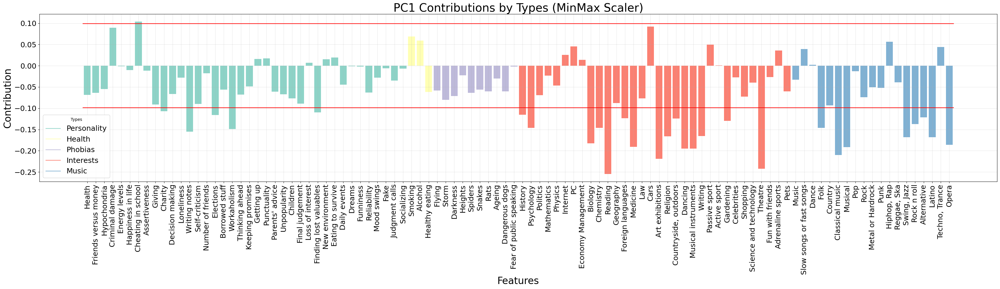

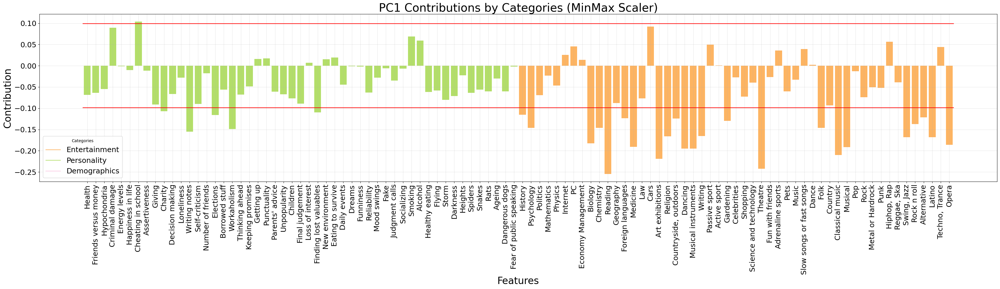


****************** PC1 **********************
HIGH-VALUED POSITIVE COMPONENTS (TYPES): ['Cheating in school']
HIGH-VALUED NEGATIVE COMPONENTS (TYPES): ['Reading', 'Theatre', 'Art exhibitions', 'Classical music', 'Dancing', 'Musical instruments', 'Musical', 'Medicine', 'Opera', 'Biology', 'Swing, Jazz', 'Latino', 'Religion', 'Writing', 'Writing notes', 'Workaholism', 'Psychology', 'Folk', 'Chemistry', 'Rock n roll', 'Gardening', 'Countryside, outdoors', 'Foreign languages', 'Alternative', 'Elections', 'History', 'Finding lost valuables', 'Charity']

HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): ['Cheating in school']
HIGH-VALUED NEGATIVE COMPONENTS (CATEGORIES): ['Reading', 'Theatre', 'Art exhibitions', 'Classical music', 'Dancing', 'Musical instruments', 'Musical', 'Medicine', 'Opera', 'Biology', 'Swing, Jazz', 'Latino', 'Religion', 'Writing', 'Writing notes', 'Workaholism', 'Psychology', 'Folk', 'Chemistry', 'Rock n roll', 'Gardening', 'Countryside, outdoors', 'Foreign languages', 'A

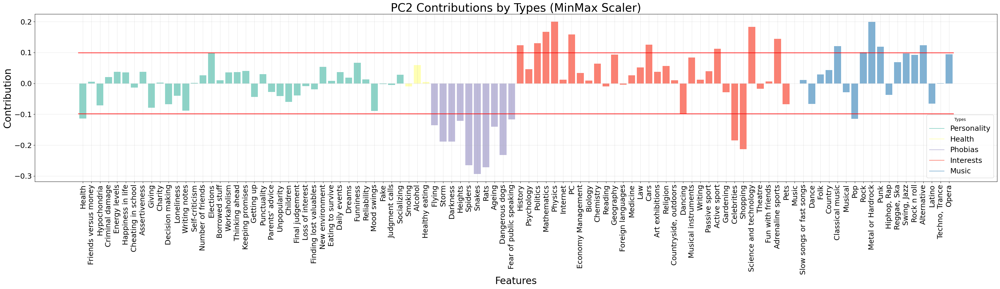

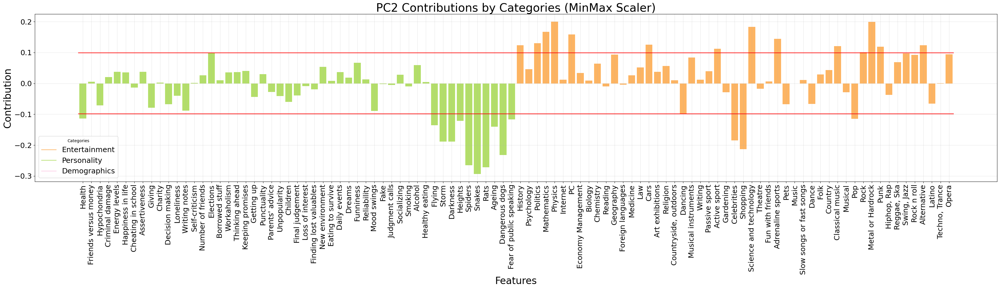


****************** PC2 **********************
HIGH-VALUED POSITIVE COMPONENTS (TYPES): ['Physics', 'Metal or Hardrock', 'Science and technology', 'Mathematics', 'PC', 'Adrenaline sports', 'Politics', 'Cars', 'Alternative', 'History', 'Classical music', 'Punk', 'Active sport', 'Rock']
HIGH-VALUED NEGATIVE COMPONENTS (TYPES): ['Snakes', 'Rats', 'Spiders', 'Dangerous dogs', 'Shopping', 'Storm', 'Darkness', 'Celebrities', 'Ageing', 'Flying', 'Heights', 'Fear of public speaking', 'Pop', 'Health']

HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): ['Physics', 'Metal or Hardrock', 'Science and technology', 'Mathematics', 'PC', 'Adrenaline sports', 'Politics', 'Cars', 'Alternative', 'History', 'Classical music', 'Punk', 'Active sport', 'Rock']
HIGH-VALUED NEGATIVE COMPONENTS (CATEGORIES): ['Snakes', 'Rats', 'Spiders', 'Dangerous dogs', 'Shopping', 'Storm', 'Darkness', 'Celebrities', 'Ageing', 'Flying', 'Heights', 'Fear of public speaking', 'Pop', 'Health']
****************************************

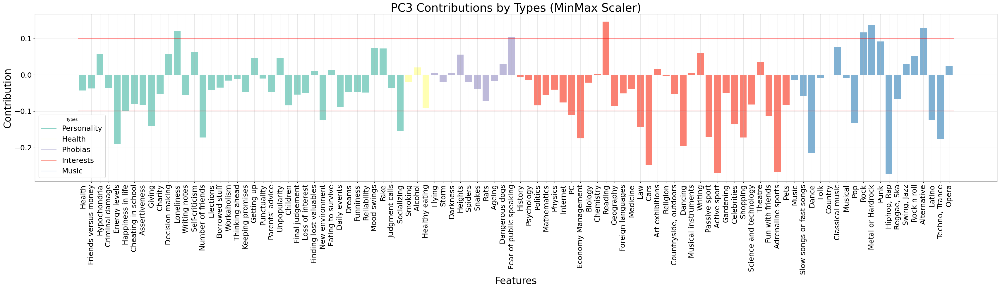

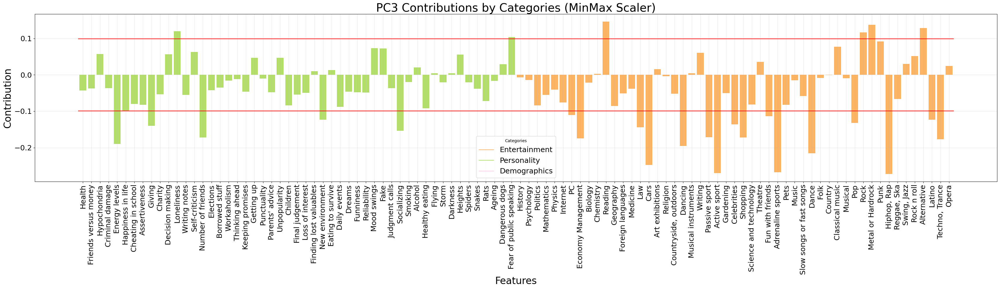


****************** PC3 **********************
HIGH-VALUED POSITIVE COMPONENTS (TYPES): ['Reading', 'Metal or Hardrock', 'Alternative', 'Loneliness', 'Rock', 'Fear of public speaking']
HIGH-VALUED NEGATIVE COMPONENTS (TYPES): ['Hiphop, Rap', 'Active sport', 'Adrenaline sports', 'Cars', 'Dance', 'Dancing', 'Energy levels', 'Techno, Trance', 'Economy Management', 'Number of friends', 'Shopping', 'Passive sport', 'Socializing', 'Law', 'Giving', 'Celebrities', 'Pop', 'Latino', 'New environment', 'Fun with friends', 'PC', 'Happiness in life']

HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): ['Reading', 'Metal or Hardrock', 'Alternative', 'Loneliness', 'Rock', 'Fear of public speaking']
HIGH-VALUED NEGATIVE COMPONENTS (CATEGORIES): ['Hiphop, Rap', 'Active sport', 'Adrenaline sports', 'Cars', 'Dance', 'Dancing', 'Energy levels', 'Techno, Trance', 'Economy Management', 'Number of friends', 'Shopping', 'Passive sport', 'Socializing', 'Law', 'Giving', 'Celebrities', 'Pop', 'Latino', 'New environme

In [33]:
# DEFINE EPSILON
# Epsilon is a threshold used to identify significant contributions in the PCA components.
eps = np.sqrt(1 / pca_std_m.n_features_in_)

# DEFINE COLORS FOR SKILL TYPES AND CATEGORIES
# Extract the color column from the dataframes for types and categories
colors_type = types_df.loc[:, 'Color']  
colors_cat = cats_df.loc[:, 'Color']  

# CREATE LEGENDS FOR TYPES AND CATEGORIES
# Generate custom legends for types and categories using their respective colors
type_colors_legend = [Line2D([0], [0], color=type_colors[k]) for k in type_colors.keys()]
cat_colors_legend = [Line2D([0], [0], color=cat_colors[k]) for k in cat_colors.keys()]

# LOOP THROUGH THE FIRST 3 PRINCIPAL COMPONENTS
# For each of the first 3 PCs, generate bar plots for contributions by types and categories
for ii in range(3):
    # Get PCA components for the current principal component
    pc_components = pca_mm_m.components_[ii]
    
    # BAR PLOT FOR TYPES
    plt.figure(figsize=(34, 10))
    plt.bar(range(len(pc_components)), pc_components, color=colors_type)
    plt.plot([-0.5, len(pc_components) - 0.5], [eps, eps], 'red', label='Epsilon Threshold')  # Positive threshold
    plt.plot([-0.5, len(pc_components) - 0.5], [-eps, -eps], 'red')  # Negative threshold
    plt.title(f'PC{ii+1} Contributions by Types (MinMax Scaler)', fontsize=28)
    plt.xlabel('Features', fontsize=24)
    plt.ylabel('Contribution', fontsize=24)
    plt.legend(type_colors_legend, type_colors.keys(), title='Types', fontsize=18)  # Add custom legend
    plt.xticks(range(len(pc_components)), types_df['Feature'], rotation=90, fontsize=18)  # Feature names as x-axis labels
    plt.tight_layout()
    plt.tick_params(axis='y', labelsize=18)
    plt.grid(alpha=0.3)  # Add grid for better visualization
    plt.show()
    
    # BAR PLOT FOR CATEGORIES
    plt.figure(figsize=(34, 10))
    plt.bar(range(len(pc_components)), pc_components, color=colors_cat)
    plt.plot([-0.5, len(pc_components) - 0.5], [eps, eps], 'red', label='Epsilon Threshold')  # Positive threshold
    plt.plot([-0.5, len(pc_components) - 0.5], [-eps, -eps], 'red')  # Negative threshold
    plt.title(f'PC{ii+1} Contributions by Categories (MinMax Scaler)', fontsize=28)
    plt.xlabel('Features', fontsize=24)
    plt.ylabel('Contribution', fontsize=24)
    plt.legend(cat_colors_legend, cat_colors.keys(), title='Categories', fontsize=18)  # Add custom legend
    plt.xticks(range(len(pc_components)), cats_df['Feature'], rotation=90, fontsize=18)  # Feature names as x-axis labels
    plt.tight_layout()
    plt.tick_params(axis='y', labelsize=18)
    plt.grid(alpha=0.3)  # Add grid for better visualization
    plt.show()
    
    # IDENTIFY SIGNIFICANT COMPONENTS
    # Sort components to identify features with high positive and negative contributions
    sorted_positive_types = [
        types_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1], reverse=True) if value > eps
    ]
    sorted_negative_types = [
        types_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1]) if value < -eps
    ]
    
    sorted_positive_cats = [
        cats_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1], reverse=True) if value > eps
    ]
    sorted_negative_cats = [
        cats_df['Feature'][idx]
        for idx, value in sorted(enumerate(pc_components), key=lambda x: x[1]) if value < -eps
    ]
    
    # PRINT SIGNIFICANT FEATURES
    # Display features with significant positive and negative contributions for types and categories
    print('')
    print(f'****************** PC{ii+1} **********************')
    print(f'HIGH-VALUED POSITIVE COMPONENTS (TYPES): {sorted_positive_types}')
    print(f'HIGH-VALUED NEGATIVE COMPONENTS (TYPES): {sorted_negative_types}')
    print('')
    print(f'HIGH-VALUED POSITIVE COMPONENTS (CATEGORIES): {sorted_positive_cats}')
    print(f'HIGH-VALUED NEGATIVE COMPONENTS (CATEGORIES): {sorted_negative_cats}')
    print('*********************************************')
    print('')


### Observations and Interpretations for MinMax Scaled Dataset (PC1, PC2, PC3)

---

### **PC1 (Principal Component 1)**

- **Positive Contributions**:  
  Features like *Theatre*, *Classical Music*, *Art Exhibitions*, and *Opera* strongly reflect cultural and intellectual engagement.  
  Personality traits such as *Workaholism*, *Reliability*, and *Giving* highlight responsibility, ethics, and dedication to meaningful pursuits.  

- **Negative Contributions**:  
  The most significant negative feature, *Cheating in School*, signifies rule-breaking behavior and a lack of ethical focus, directly contrasting the positive traits.

- **Interpretation**:  
  PC1 distinguishes between **Rule Breaker (-)**, characterized by ethical disregard and academic dishonesty, and **Cultural & Intellectual Enthusiast (+)**, emphasizing creativity, responsibility, and intellectual curiosity.

---

### **PC2 (Principal Component 2)**

- **Positive Contributions**:  
  Features like *Snakes*, *Rats*, *Shopping*, and *Celebrities* suggest fear sensitivity, focus on appearance, and materialistic tendencies.  
  Other contributions, like *Pop* and *Health*, indicate a preference for contemporary culture and lifestyle awareness.

- **Negative Contributions**:  
  Traits such as *Physics*, *Metal or Hardrock*, *Science and Technology*, and *Mathematics* suggest analytical, intellectual, and countercultural inclinations.  
  Other features, like *Adrenaline Sports* and *Cars*, highlight adventurousness and thrill-seeking tendencies.

- **Interpretation**:  
  PC2 captures a spectrum between **Metalhead & Geek (-)**, representing countercultural and analytical traits, and **Fearful & Materialist (+)**, highlighting fear-prone, appearance-conscious, and trendy tendencies.

---

### **PC3 (Principal Component 3)**

- **Positive Contributions**:  
  Features such as *Hiphop, Rap*, *Socializing*, *Dancing*, and *Energy Levels* point to a socially confident and energetic personality.  
  Other traits, like *Fun with Friends* and *Happiness in Life*, emphasize sociability and enthusiasm for social engagement.

- **Negative Contributions**:  
  Traits like *Reading*, *Metal or Hardrock*, *Alternative*, and *Loneliness* suggest introspection, countercultural preferences, and discomfort in social settings.  
  The presence of *Fear of Public Speaking* further highlights social hesitation.

- **Interpretation**:  
  PC3 highlights a distinction between **Introvert (-)**, reflecting introspection and countercultural traits, and **Socially Confident & Energetic (+)**, emphasizing vibrancy, sociability, and mainstream cultural engagement.

---

### Overall Insights
  - **PC1** = `Rule Breaker (-) vs. Cultural & Intellectual Enthusiast (+)`  
  - **PC2** = `Metalhead & Geek (-) vs. Fearful & Materialist (+)`  
  - **PC3** = `Introvert (-) vs. Socially Confident & Energetic (+)`  

---

These components provide a nuanced understanding of how individuals’ behaviors and preferences align with cultural engagement, fear sensitivity, social confidence, and subcultural versus mainstream tendencies.

### Comparison Between Standard Scaled and MinMax Scaled Datasets (PC1, PC2, PC3)

---

#### **Similarities**:
1. **PC1: Rule Breaker (-) vs. Cultural & Intellectual Enthusiast (+)**:
   - Both datasets capture the contrast between rule-breaking behaviors (*Cheating in School*) and cultural, intellectual engagement (*Theatre*, *Classical Music*).

2. **PC3: Socially Confident & Energetic (+) vs. Introvert (-)**:
   - Both datasets highlight the divide between socially vibrant individuals (*Socializing*, *Dancing*) and introspective, countercultural tendencies (*Reading*, *Metal or Hardrock*).

3. **Themes**:
   - Both datasets explore dimensions of cultural engagement, social tendencies, and countercultural versus mainstream preferences.

---

#### **Differences**:
1. **PC2 Interpretations**:
   - Standard Scaled: **Fearful & Hesitant (-)** vs. **Socially Confident & Energetic (+)** (fear is negative).  
   - MinMax Scaled: **Metalhead & Geek (-)** vs. **Fearful & Materialist (+)** (fear is now positive).

2. **Feature Emphasis**:
   - MinMax gives more weight to intellectual traits (*Physics*, *Mathematics*) and energetic activities (*Adrenaline Sports*), while Standard focuses on personality traits (*Energy Levels*, *Happiness in Life*).

3. **Naming Adjustments**:
   - MinMax labels are more specific, reflecting analytical and countercultural traits in PC2.

## PCs Naming

In [34]:
pc_names_s = [
    'Rule Breaker (-) vs. Cultural & Intellectual Enthusiast (+)',
    'Fearful & Hesitant (-) vs. Socially Confident & Energetic (+)',
    'Metalhead & Classic Music Enthusiast (-) vs. Vibrant & Trendy & Fearful (+)'
]

In [35]:
pc_names_m = [
    'Rule Breaker (-) vs. Cultural & Intellectual Enthusiast (+)',
    'Metalhead & Geek (-) vs. Fearful & Materilaist (+)',
    'Introvert (-) vs. Socially Confident & Energetic (+)'
]

### Transforming Data into New Basis with PCA For Both Standard and MinMax Scaled Datasets

In [36]:
Ymm_df = pca_mm_m.transform(Xmm_df)
Ystd_df = pca_std_m.transform(Xstd_df)

# Score Graph (3D)

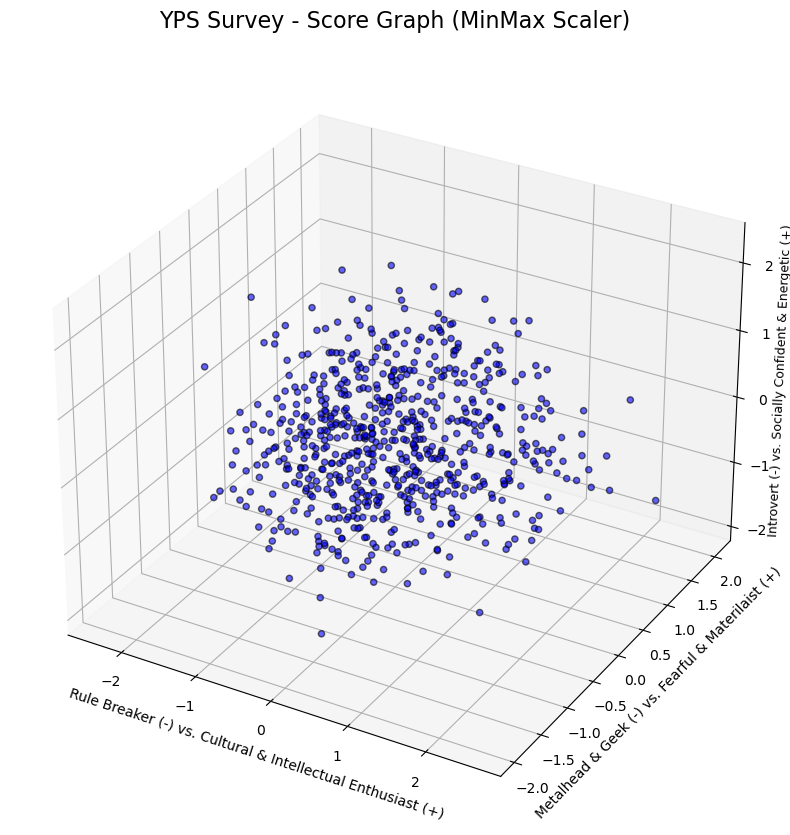

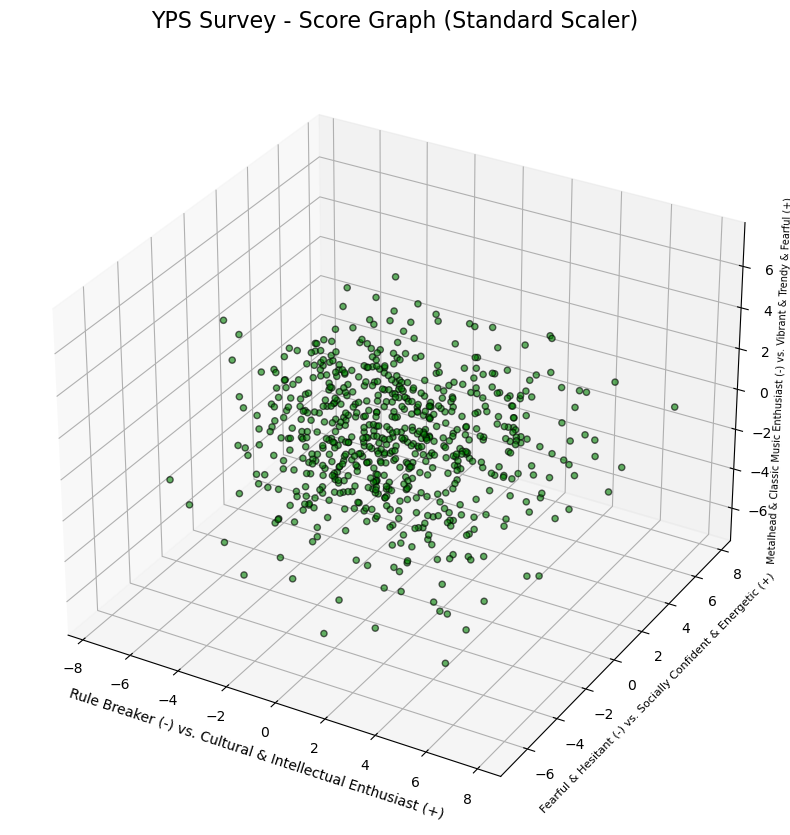

In [38]:
# 3D Score Graph for MinMax Scaler
sg_3d_mm = plt.figure(figsize=(10, 10))
ax_sg_3d_mm = sg_3d_mm.add_subplot(111, projection='3d')

# Scatter plot with marker size and transparency
ax_sg_3d_mm.scatter(Ymm_df[:, 0], Ymm_df[:, 1], Ymm_df[:, 2], 
                    c='blue', alpha=0.6, edgecolor='k')

# Setting labels and title
ax_sg_3d_mm.set_title('YPS Survey - Score Graph (MinMax Scaler)', fontsize=16, pad=20)
ax_sg_3d_mm.set_xlabel(pc_names_m[0], fontsize=10)
ax_sg_3d_mm.set_ylabel(pc_names_m[1], fontsize=10)
ax_sg_3d_mm.set_zlabel(pc_names_m[2], fontsize=9, labelpad=-2)

ax_sg_3d_mm.grid(alpha=0.4)

# Display plot
plt.show()

# 3D Score Graph for Standard Scaler
sg_3d_std = plt.figure(figsize=(10, 10))
ax_sg_3d_std = sg_3d_std.add_subplot(111, projection='3d')

# Scatter plot with marker size and transparency
ax_sg_3d_std.scatter(Ystd_df[:, 0], Ystd_df[:, 1], Ystd_df[:, 2], 
                     c='green', alpha=0.6, edgecolor='k')

# Setting labels and title
ax_sg_3d_std.set_title('YPS Survey - Score Graph (Standard Scaler)', fontsize=16, pad=20)
ax_sg_3d_std.set_xlabel(pc_names_s[0], fontsize=10)
ax_sg_3d_std.set_ylabel(pc_names_s[1], fontsize=8)
ax_sg_3d_std.set_zlabel(pc_names_s[2], fontsize=7, labelpad=-2)

ax_sg_3d_std.grid(alpha=0.4)

# Display plot
plt.show()

# Score Graph (2D)

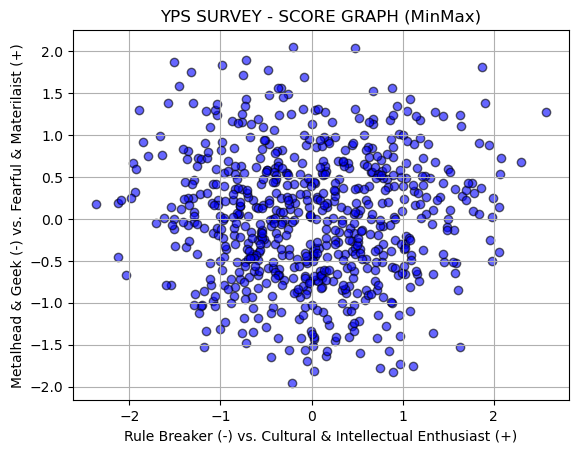

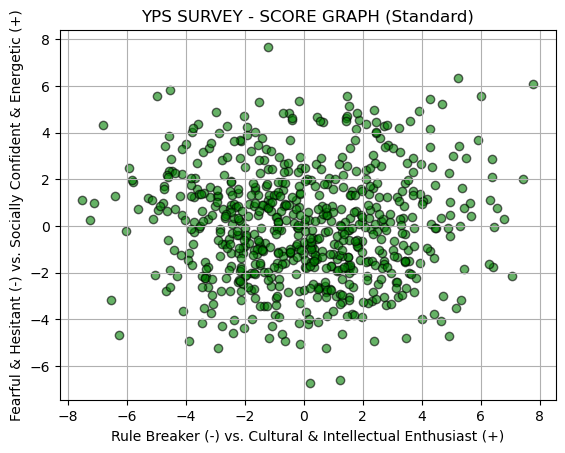

In [39]:
# MAKE THE 2D SCORE GRAPH
plt.figure()
plt.scatter(Ymm_df[:, 0], Ymm_df[:, 1], c='blue', alpha=0.6, edgecolor='k') 
plt.title('YPS SURVEY - SCORE GRAPH (MinMax)')
plt.xlabel(pc_names_m[0])
plt.ylabel(pc_names_m[1])
plt.grid()
plt.show()


# MAKE THE 2D SCORE GRAPH
plt.figure()
plt.scatter(Ystd_df[:, 0], Ystd_df[:, 1], c='green', alpha=0.6, edgecolor='k')
plt.title('YPS SURVEY - SCORE GRAPH (Standard)')
plt.xlabel(pc_names_s[0])
plt.ylabel(pc_names_s[1])
plt.grid()
plt.show()

In [40]:
# Step 1: Define the colors from the colormap (Set1)
set1_colors = cm.Set1.colors  # Use colors from Set1

default_color = set1_colors[5]

In [41]:
# Get the indices of the sampled rows in X_df
sampled_indices = X_df.index

# Apply the same indices to my_df to align the rows
my_df_sampled = my_df.loc[sampled_indices]

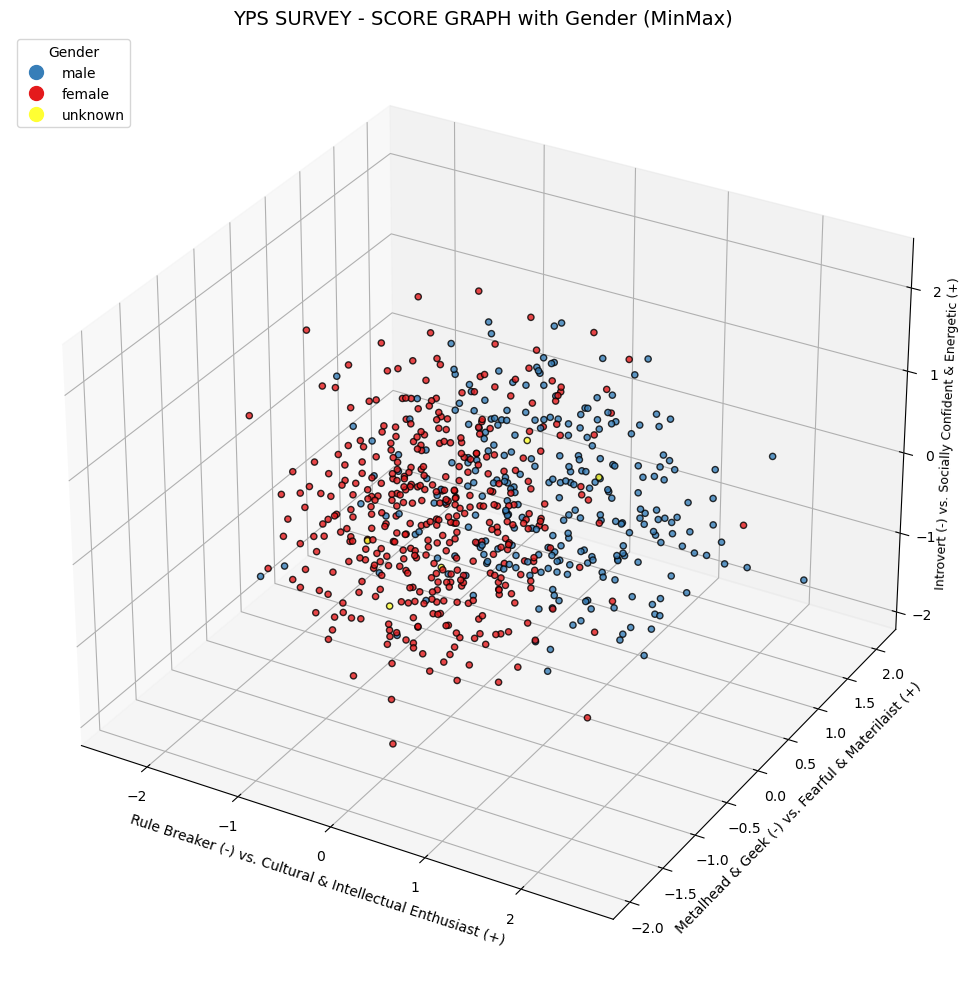

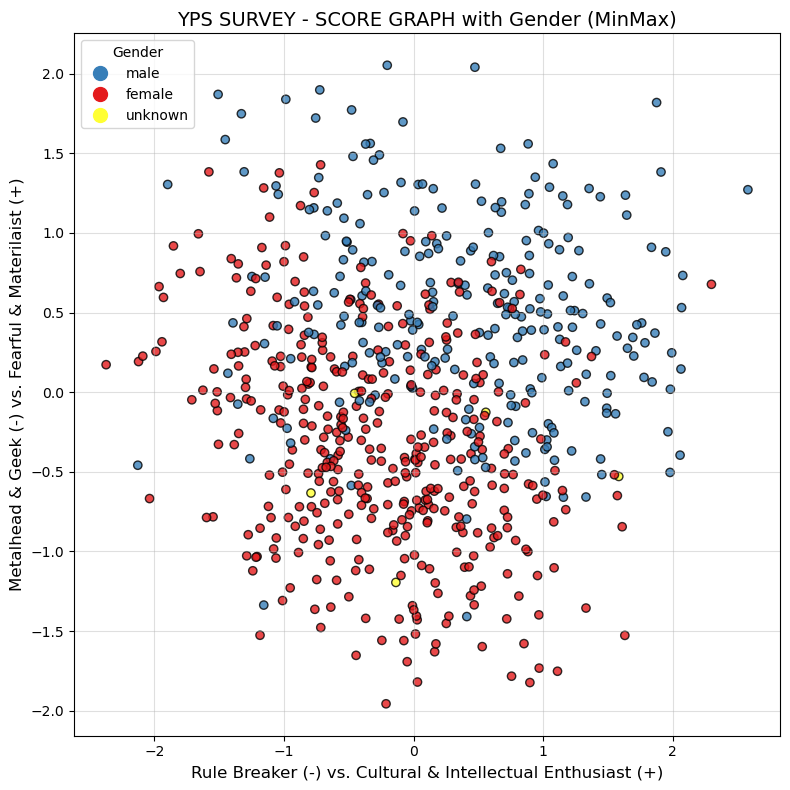

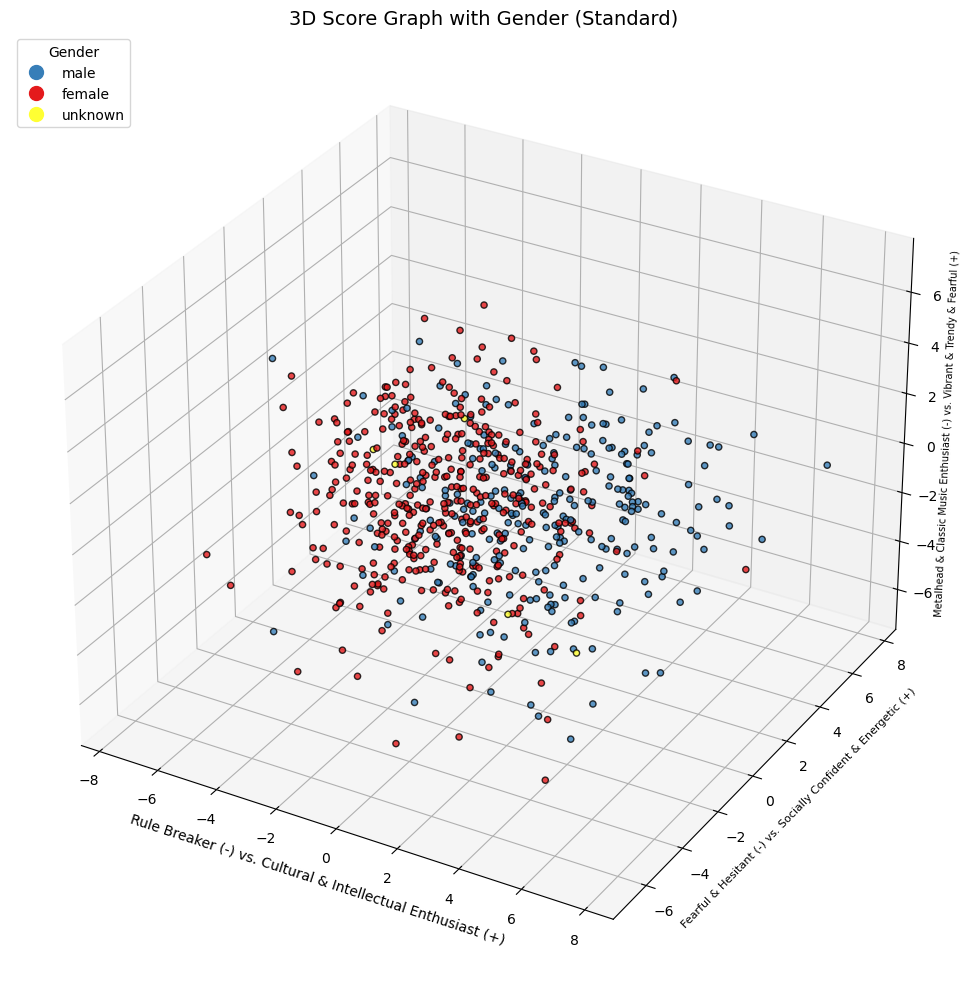

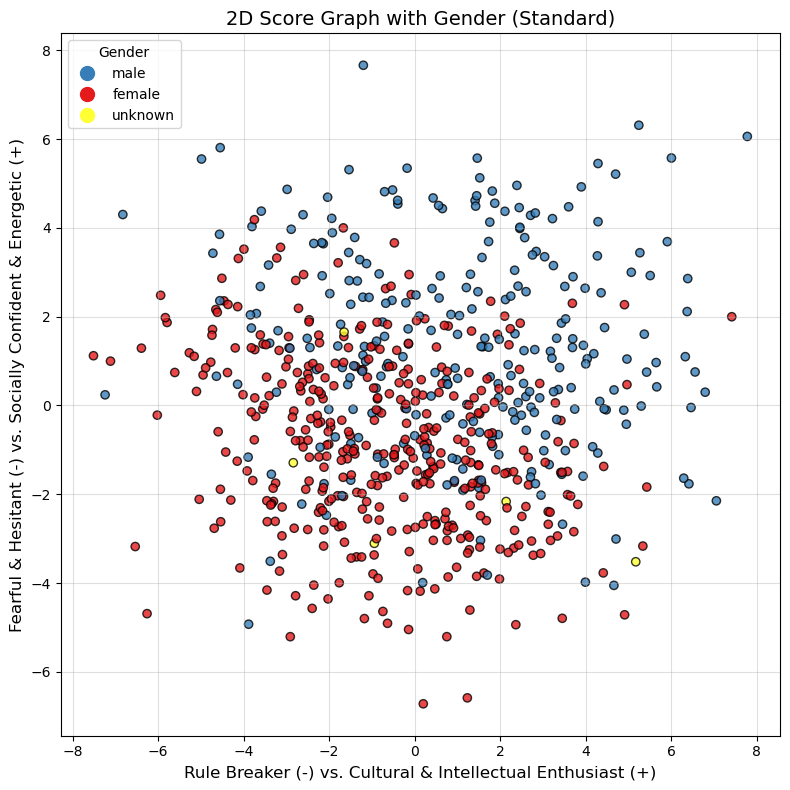

In [42]:
# Define colors for Gender
gender_colors = {
    'male': set1_colors[1],    # BLue for male
    'female': set1_colors[0],  # Red for female
    'unknown': default_color   # Yellow for any unknown entries (if applicable)
}

# Fill empty or unexpected entries in Gender and map colors
my_df_sampled['Gender'] = my_df_sampled['Gender'].fillna('unknown')  # Handle empty entries (NaN)
my_df_sampled['color'] = my_df_sampled['Gender'].apply(lambda x: gender_colors.get(x, default_color))

# 3D Score Graph (MinMax Scaler) with Gender Labels
sg_3d_mm_gender = plt.figure(figsize=(10, 10))
ax_sg_3d_mm_gender = sg_3d_mm_gender.add_subplot(111, projection='3d')
ax_sg_3d_mm_gender.scatter(
    Ymm_df[:, 0], Ymm_df[:, 1], Ymm_df[:, 2], 
    c=my_df_sampled['color'], alpha=0.8, edgecolor='k'
)
plt.title('YPS SURVEY - SCORE GRAPH with Gender (MinMax)', fontsize=14)
ax_sg_3d_mm_gender.set_xlabel(pc_names_m[0], fontsize=10)
ax_sg_3d_mm_gender.set_ylabel(pc_names_m[1], fontsize=10)
ax_sg_3d_mm_gender.set_zlabel(pc_names_m[2], fontsize=9, labelpad=-2)

# Custom legend for Gender
gender_legend = [
    Line2D([0], [0], color=color, marker='o', linestyle='', markersize=10) 
    for gender, color in gender_colors.items()
]
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

# 2D Score Graph (MinMax Scaler) with Gender Labels
plt.figure(figsize=(8, 8))
plt.scatter(
    Ymm_df[:, 0], Ymm_df[:, 1], 
    c=my_df_sampled['color'], alpha=0.8, edgecolor='k'
)
plt.title('YPS SURVEY - SCORE GRAPH with Gender (MinMax)', fontsize=14)
plt.xlabel(pc_names_m[0], fontsize=12)
plt.ylabel(pc_names_m[1], fontsize=12)

# Custom legend for Gender
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()


# Gender-based 3D Scatter Plot (Standard Scaler)
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(
    Ystd_df[:, 0], Ystd_df[:, 1], Ystd_df[:, 2],
    c=my_df_sampled['color'], alpha=0.8, edgecolor='k'
)
ax.set_title('3D Score Graph with Gender (Standard)', fontsize=14)
ax.set_xlabel(pc_names_s[0], fontsize=10)
ax.set_ylabel(pc_names_s[1], fontsize=8)
ax.set_zlabel(pc_names_s[2], fontsize=7, labelpad=-2)
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()


# Gender-based 2D Scatter Plot (Standard Scaler)
plt.figure(figsize=(8, 8))
plt.scatter(
    Ystd_df[:, 0], Ystd_df[:, 1],
    c=my_df_sampled['color'], alpha=0.8, edgecolor='k'
)
plt.title('2D Score Graph with Gender (Standard)', fontsize=14)
plt.xlabel(pc_names_s[0], fontsize=12)
plt.ylabel(pc_names_s[1], fontsize=12)
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

### Interpretation of MinMax Scaled Charts

The **MinMax Scaled Charts** for Gender reveal the following insights into behavioral tendencies and principal component distributions:

1. **Rule Breakers and Cheating**:  
   - Males are more frequently associated with *rule-breaking behaviors*, as evidenced by a stronger association with the "Cheating in School" feature.  
   - Females tend to align more with cultural and intellectual enthusiasm, contrasting with the rule-breaking tendencies of males.

2. **Social Confidence and Energetic Traits**:  
   - Males dominate the *socially confident and energetic* spectrum, as they are more dispersed across higher values along PC2.  
   - Females, on the other hand, tend to lean more towards *fearful and hesitant* traits, with lower values in PC2.

3. **Music Preferences**:  
   - Males are more likely to prefer *metalhead and geek-associated* music, clustering strongly in this area.  
   - Females gravitate towards *trendy and vibrant music preferences*, aligning with more contemporary and socially-driven music styles.

4. **Materialism**:  
   - Females exhibit higher tendencies towards *materialistic behaviors* compared to males, as shown by their positions in related clusters.

5. **Introversion and Cheating**:  
   - Introverted females are less likely to cheat in school, showcasing a higher ethical alignment.  
   - Conversely, males who are introverted are still associated with rule-breaking behaviors like cheating, reflecting gender-based behavioral differences.

6. **Overall Trends**:  
   - Males are more represented among *rule breakers* and *socially confident, energetic individuals*.  
   - Females show a stronger alignment with *cultural and intellectual enthusiasm*, with a focus on trends, materialism, and more cautious behavior.

---

### Interpretation of Standard Scaled Charts

The **Standard Scaled Charts** further amplify these patterns, offering more spread and variability:

1. **Rule Breakers**:  
   - Males remain dominant in the *rule breaker* spectrum, with higher representation in clusters associated with cheating and ethical disregard.  
   - Females predominantly align with higher values of cultural and intellectual traits.

2. **Social Confidence vs. Hesitance**:  
   - The broader spread in the Standard Scaled Charts emphasizes males' dominance in *socially confident and energetic* traits, while females cluster in regions tied to *fearfulness and hesitation*.  

3. **Music and Lifestyle Preferences**:  
   - Males lean towards *alternative and metalhead music preferences*, showcasing countercultural tendencies.  
   - Females are more prominent in clusters tied to *trendy, socially vibrant, and materialistic lifestyles*.

4. **Introversion and Ethics**:  
   - Standard scaling clarifies that introverted females maintain ethical alignment, while introverted males are still more likely to cheat, reinforcing a behavioral divide.

5. **Overall Patterns**:  
   - The broader spread highlights that males dominate *rule-breaking, confidence, and energetic clusters*, while females are more strongly associated with *intellectual, cultural, and cautious behaviors*.  

---

### Key Observations Across Both Scales:
- Males are generally more *rule-breaking*, *socially confident*, and lean towards *alternative cultural tastes*.  
- Females exhibit stronger *cultural and intellectual engagement*, *trendy behavior*, and *materialistic tendencies*.  
- Introverted males and females show differing behaviors, with females maintaining ethics while introverted males are more likely to cheat.  
- Gender-specific tendencies in music, materialism, and personality traits are consistently apparent across both scales.

## Exercise 4. $k$-Means

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), run the $k$-Means for clustering the data. In particular, **use the silohuette score for identify the best value for $k\in\{3, \ldots, 10\}$**.
2. Plot the score graphs of exercise 3.3, adding the centroids of the cluster.
3. Observing the centroids coordinates in the PC space, **give a name/interpretation to them**, exploiting the names you assigned to the PCs. **Comment and motivate your interpretations**.


*************** START k-MEANS WITH k=3 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1771


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1691
*************** END k-MEANS WITH k=3 ***************

*************** START k-MEANS WITH k=4 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1804


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1755
*************** END k-MEANS WITH k=4 ***************

*************** START k-MEANS WITH k=5 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1696


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1675
*************** END k-MEANS WITH k=5 ***************

*************** START k-MEANS WITH k=6 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1631


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1604
*************** END k-MEANS WITH k=6 ***************

*************** START k-MEANS WITH k=7 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1769


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1658
*************** END k-MEANS WITH k=7 ***************

*************** START k-MEANS WITH k=8 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1666


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1590
*************** END k-MEANS WITH k=8 ***************

*************** START k-MEANS WITH k=9 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1623


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1557
*************** END k-MEANS WITH k=9 ***************

*************** START k-MEANS WITH k=10 ***************
Computing...


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (MinMax): 0.1612


C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


Silhouette Score (Standard): 0.1605
*************** END k-MEANS WITH k=10 ***************
Optimal k for MinMax Scaler: 4
Optimal k for Standard Scaler: 4


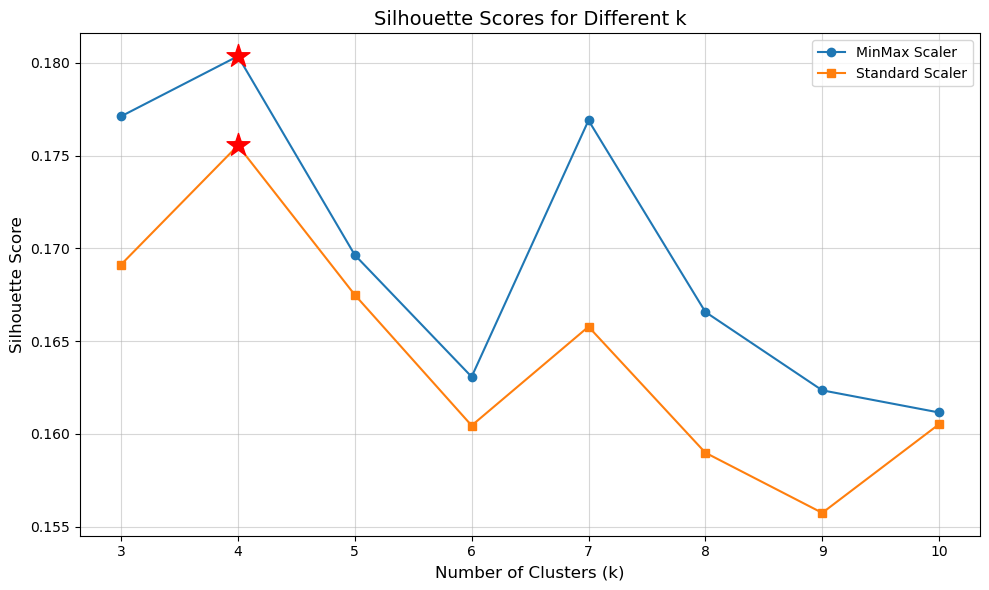

In [43]:
# Initialize variables
k_values = range(3, 11)  # k = 3 to 10
silhouette_scores_mm = []
silhouette_scores_std = []

# Compute KMeans and Silhouette Score for MinMax and StandardScaler
for k in k_values:
    print(f"\n*************** START k-MEANS WITH k={k} ***************")
    print("Computing...")

    # MinMax Scaler
    km_mm = KMeans(n_clusters=k, random_state=random_seed)
    km_mm.fit(Ymm_df)
    silhouette_scores_mm.append(silhouette_score(Ymm_df, km_mm.labels_))
    print(f"Silhouette Score (MinMax): {silhouette_scores_mm[-1]:.4f}")

    # Standard Scaler
    km_std = KMeans(n_clusters=k, random_state=random_seed)
    km_std.fit(Ystd_df)
    silhouette_scores_std.append(silhouette_score(Ystd_df, km_std.labels_))
    print(f"Silhouette Score (Standard): {silhouette_scores_std[-1]:.4f}")

    print(f"*************** END k-MEANS WITH k={k} ***************")

# Choose Best k
best_k_mm = k_values[np.argmax(silhouette_scores_mm)]
best_k_std = k_values[np.argmax(silhouette_scores_std)]
print(f"Optimal k for MinMax Scaler: {best_k_mm}")
print(f"Optimal k for Standard Scaler: {best_k_std}")


# Plot Silhouette Scores for both MinMax and Standard Scaler
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores_mm, marker='o', label='MinMax Scaler')
plt.plot(k_values, silhouette_scores_std, marker='s', label='Standard Scaler')
plt.scatter(
    best_k_mm, max(silhouette_scores_mm),
    color='red', marker='*', s=300, zorder=2
)
plt.scatter(
    best_k_std, max(silhouette_scores_std),
    color='red', marker='*', s=300, zorder=2
)
plt.xticks(k_values)
plt.xlabel('Number of Clusters (k)', fontsize=12)
plt.ylabel('Silhouette Score', fontsize=12)
plt.title('Silhouette Scores for Different k', fontsize=14)
plt.legend(fontsize=10)
plt.grid(alpha=0.5)
plt.tight_layout()
plt.show()

## **Best Value for K**

**Key Findings**:
- **Optimal \(k\)**: The best number of clusters is \(`k=4`\) for both datasets based on maximum silhouette scores:
  - **MinMax Scaler**: Silhouette score = **0.1803** at \(`k=4`\).
  - **Standard Scaler**: Silhouette score = **0.1761** at \(`k=4`\).
---
**Conclusion**:
\(`k=4`\) provides the best clustering for both datasets, ensuring good cluster separability and compactness.

C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, wh

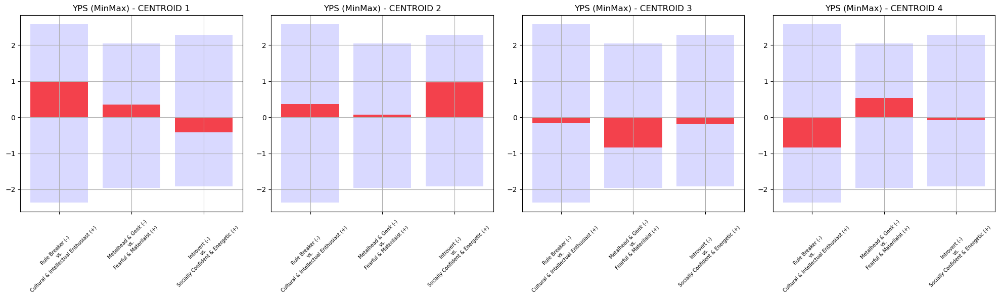

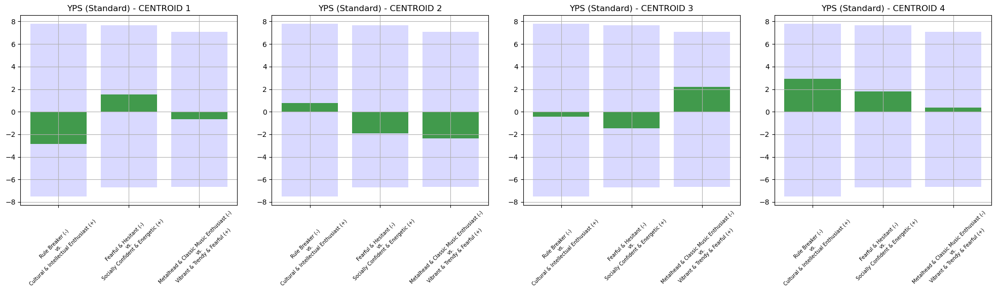

In [44]:
# Perform KMeans clustering for both MinMax and Standard-scaled datasets
km_mm_b = KMeans(n_clusters=best_k_mm, random_state=random_seed)
km_mm_b.fit(Ymm_df)

km_std_b = KMeans(n_clusters=best_k_std, random_state=random_seed)
km_std_b.fit(Ystd_df)

# Compute the maximum and minimum values for the first three Principal Components (MinMax Scaler)
maxs_mm = Ymm_df.max(axis=0)[:3] 
mins_mm = Ymm_df.min(axis=0)[:3]

# Compute the maximum and minimum values for the first three Principal Components (Standard Scaler)
maxs_std = Ystd_df.max(axis=0)[:3] 
mins_std = Ystd_df.min(axis=0)[:3] 

# Define Principal Component labels for MinMax and Standard-scaled datasets
mmPC1 = pc_names_m[0]
mmPC2 = pc_names_m[1]
mmPC3 = pc_names_m[2]

stdPC1 = pc_names_s[0]
stdPC2 = pc_names_s[1]
stdPC3 = pc_names_s[2]

# Wrap long labels for better visualization by adding line breaks
wrapped_mm_labels = [mmPC1.replace(" vs. ", "\nvs.\n"), mmPC2.replace(" vs. ", "\nvs.\n"), mmPC3.replace(" vs. ", "\nvs.\n")]
wrapped_std_labels = [stdPC1.replace(" vs. ", "\nvs.\n"), stdPC2.replace(" vs. ", "\nvs.\n"), stdPC3.replace(" vs. ", "\nvs.\n")]

# Visualization of MinMax Scaler clusters
fig_mm, ax_mm = plt.subplots(1, best_k_mm, figsize=(5 * best_k_mm, 6))  # Increase figure size for better clarity
for ii in range(best_k_mm):
    # Plot max and min boundaries for the Principal Components
    ax_mm[ii].bar(np.arange(3), maxs_mm, color='blue', alpha=0.15)
    ax_mm[ii].bar(np.arange(3), mins_mm, color='blue', alpha=0.15)
    # Overlay the centroid values with red bars for MinMax clusters
    ax_mm[ii].bar(np.arange(3), km_mm_b.cluster_centers_[ii, :3], color='red', alpha=0.7)
    # Add wrapped labels and adjust rotation for readability
    ax_mm[ii].set_xticks(ticks=np.arange(3))
    ax_mm[ii].set_xticklabels(labels=wrapped_mm_labels, rotation=45, ha='center', fontsize=7)
    ax_mm[ii].grid(visible=True, which='both')
    ax_mm[ii].set_title(f'YPS (MinMax) - CENTROID {ii+1}', fontsize=12)

plt.tight_layout()
plt.show()

# Visualization of Standard Scaler clusters
fig_std, ax_std = plt.subplots(1, best_k_std, figsize=(5 * best_k_std, 6))  # Increase figure size for better clarity
for ii in range(best_k_std):
    # Plot max and min boundaries for the Principal Components
    ax_std[ii].bar(np.arange(3), maxs_std, color='blue', alpha=0.15)
    ax_std[ii].bar(np.arange(3), mins_std, color='blue', alpha=0.15)
    # Overlay the centroid values with green bars for Standard clusters
    ax_std[ii].bar(np.arange(3), km_std_b.cluster_centers_[ii, :3], color='green', alpha=0.7)
    # Add wrapped labels and adjust rotation for readability
    ax_std[ii].set_xticks(ticks=np.arange(3))
    ax_std[ii].set_xticklabels(labels=wrapped_std_labels, rotation=45, ha='center', fontsize=7)
    ax_std[ii].grid(visible=True, which='both')
    ax_std[ii].set_title(f'YPS (Standard) - CENTROID {ii+1}', fontsize=12)

plt.tight_layout()
plt.show()

**Findings**:
1. **MinMax Scaler**:
   - **Cluster 1**: Strongly associated with **Introversion**.
   - **Cluster 2**: Mainly **Cultural Intellectual**, with some **Metalhead & Geek** traits.
   - **Cluster 3**: Strongly associated with **Fearful & Materialistic** traits.
   - **Cluster 4**: Mainly **Rule Breaker**, with some **Metalhead & Geek** and **Socially Confident & Energetic** traits.

2. **Standard Scaler**:
   - **Cluster 1**: Represents **Fearful & Trendy** traits.
   - **Cluster 2**: Associated with **Metalhead & Classic Music Enthusiast** traits and also **Fearful & Hesitant** traits.
   - **Cluster 3**: Represents **Rulebreaker & Socially Confident** traits.
   - **Cluster 4**: Strongly associated with **Cultural Intellectual**, with some **Socially Confident & Energetic** traits.

### Giving Names to the Clusters

Looking at the barplots (the PC-coordinates of the centroids) printed above, we can assign names or brief descriptions to the clusters corresponding to the centroids. We also predicted which cluster primarily contains which gender.

#### **MinMax:**
1. Cluster 1: **Introvert**   ---> Both
2. Cluster 2: **Cultural Intellectual (Somehow Geek)**    ---> Both
3. Cluster 3: **Fearfull & Materialistic**    ---> Most likely Females
4. Cluster 4: **Rule Breaker (Slightly Metalhead & Socially Confident)**   ---> Most likely Males

#### **Standard:**
1. Cluster 1: **Fearful & Trendy**   ---> Most likely Females
2. Cluster 2: **Metalhead & Fearful**  ---> Both
3. Cluster 3: **Rulebreaker & Socially Confident**    ---> Most likely Males
4. Cluster 4: **Cultural Intellectual (Somehow Energetic)**  ---> Both

# Clusters Nmaing

In [45]:
# Define cluster names for MinMax
cluster_names_mm = [
                    'Introvert',
                    'Cultural Intellectual (Somehow Geek)',
                    'Fearfull & Materialistic',
                    'Rule Breaker (Slightly Metalhead & Socially Confident)'
                   ]

In [46]:
# Define cluster names for Standard
cluster_names_std = [
                    'Fearful & Trendy',
                    'Metalhead & Fearful',
                    'Rulebreaker & Socially Confident',
                    'Cultural Intellectual (Somehow Energetic)'
                   ]

### Clusters Symbol

In [47]:
# Symbols for clusters
cluster_markers = ['o', 's', '^', 'X'] 

C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Users\KIIT0001\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1436: UserWarning: KMeans is known to have a memory leak on Windows with MKL, wh

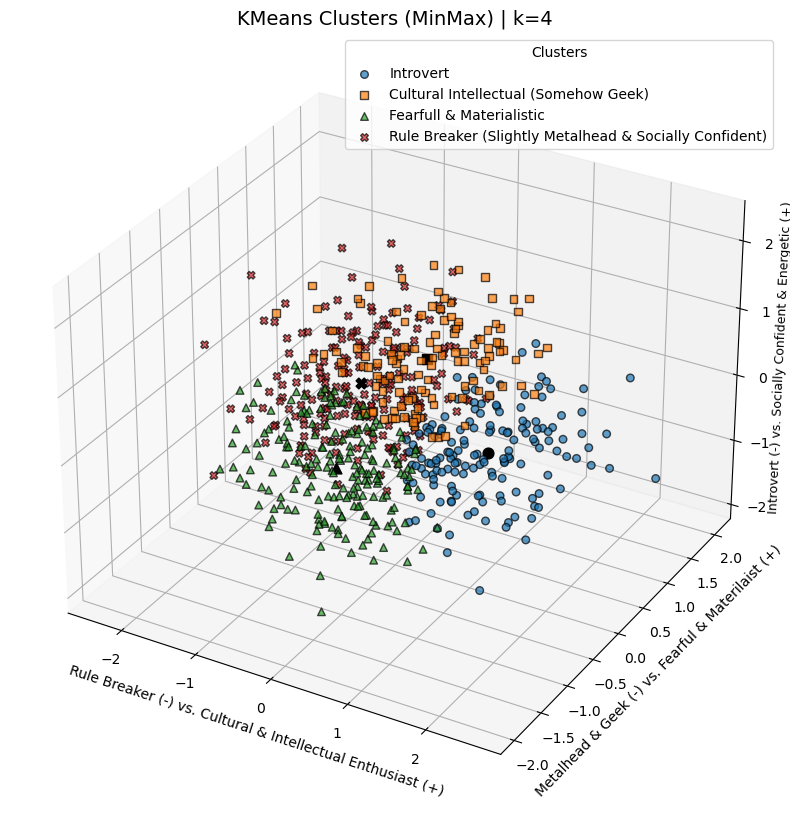

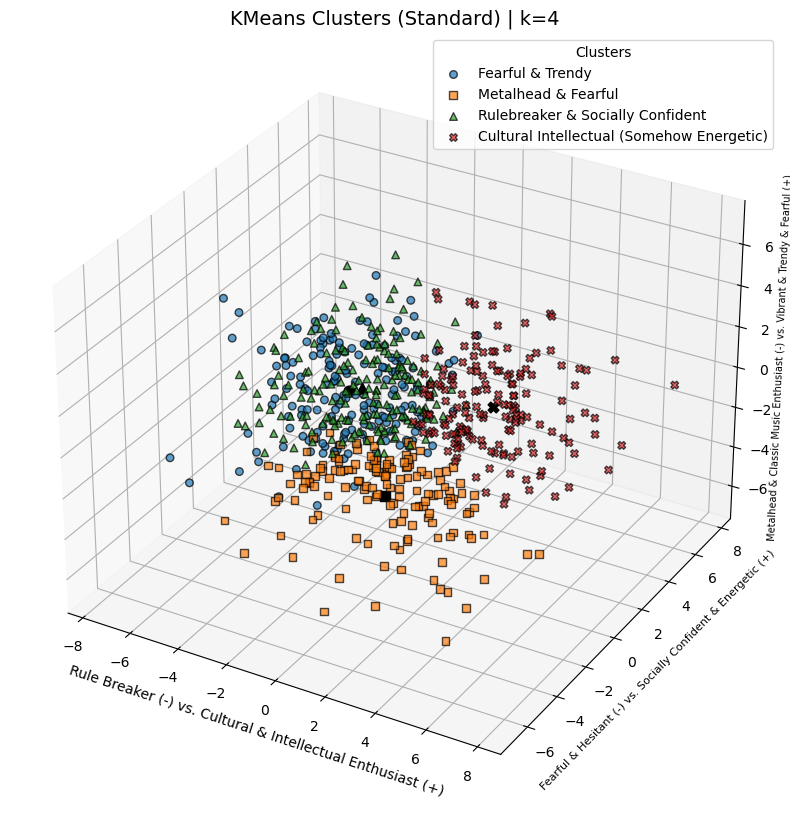

In [48]:
# Perform KMeans clustering with the optimal number of clusters (k) for both MinMax and StandardScaler data
km_mm_optimal = KMeans(n_clusters=best_k_mm, random_state=random_seed)  # KMeans for MinMax-scaled data
km_mm_optimal.fit(Ymm_df)  # Fit the MinMax-scaled data to the KMeans model

km_std_optimal = KMeans(n_clusters=best_k_std, random_state=random_seed)  # KMeans for Standard-scaled data
km_std_optimal.fit(Ystd_df)  # Fit the Standard-scaled data to the KMeans model

# ----------------------- 3D Scatter Plot for MinMax Scaler -----------------------

# Initialize a 3D plot for MinMax data
fig_mm = plt.figure(figsize=(10, 10))
ax_mm = fig_mm.add_subplot(111, projection='3d')

# Loop through each cluster to plot the data points and centroids
for cluster in range(best_k_mm):
    # Extract points that belong to the current cluster
    cluster_points = Ymm_df[km_mm_optimal.labels_ == cluster]
    
    # Plot the cluster points with specific marker and label
    ax_mm.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Cycle through markers for each cluster
        label=f"{cluster_names_mm[cluster]}", alpha=0.7, s=30, edgecolor='k'  # Set transparency and edge color
    )
    
    # Plot the centroid of the current cluster using the same marker but in black
    ax_mm.scatter(
        km_mm_optimal.cluster_centers_[cluster, 0],  # X-coordinate of the centroid
        km_mm_optimal.cluster_centers_[cluster, 1],  # Y-coordinate of the centroid
        km_mm_optimal.cluster_centers_[cluster, 2],  # Z-coordinate of the centroid
        marker=cluster_markers[cluster % len(cluster_markers)],  # Same marker as the cluster points
        color='black', s=60  # Centroid markers are larger and black
    )

# Add plot details for MinMax
ax_mm.set_title(f'KMeans Clusters (MinMax) | k={best_k_mm}', fontsize=14)  # Title of the plot
ax_mm.set_xlabel(pc_names_m[0], fontsize=10)  # Label for X-axis
ax_mm.set_ylabel(pc_names_m[1], fontsize=10)  # Label for Y-axis
ax_mm.set_zlabel(pc_names_m[2], fontsize=9, labelpad=-2)  # Label for Z-axis
ax_mm.legend(title="Clusters")  # Add a legend with cluster names
plt.show()

# ----------------------- 3D Scatter Plot for Standard Scaler -----------------------

# Initialize a 3D plot for StandardScaler data
fig_std = plt.figure(figsize=(10, 10))
ax_std = fig_std.add_subplot(111, projection='3d')

# Loop through each cluster to plot the data points and centroids
for cluster in range(best_k_std):
    # Extract points that belong to the current cluster
    cluster_points = Ystd_df[km_std_optimal.labels_ == cluster]
    
    # Plot the cluster points with specific marker and label
    ax_std.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Cycle through markers for each cluster
        label=f"{cluster_names_std[cluster]}", alpha=0.7, s=30, edgecolor='k'  # Set transparency and edge color
    )
    
    # Plot the centroid of the current cluster using the same marker but in black
    ax_std.scatter(
        km_std_optimal.cluster_centers_[cluster, 0],  # X-coordinate of the centroid
        km_std_optimal.cluster_centers_[cluster, 1],  # Y-coordinate of the centroid
        km_std_optimal.cluster_centers_[cluster, 2],  # Z-coordinate of the centroid
        marker=cluster_markers[cluster % len(cluster_markers)],  # Same marker as the cluster points
        color='black', s=60  # Centroid markers are larger and black
    )

# Add plot details for StandardScaler
ax_std.set_title(f'KMeans Clusters (Standard) | k={best_k_std}', fontsize=14)  # Title of the plot
ax_std.set_xlabel(pc_names_s[0], fontsize=10)  # Label for X-axis
ax_std.set_ylabel(pc_names_s[1], fontsize=8)  # Label for Y-axis
ax_std.set_zlabel(pc_names_s[2], fontsize=7, labelpad=-2)  # Label for Z-axis
ax_std.legend(title="Clusters")  # Add a legend with cluster names
plt.show()

### **The black markers are the centroids of each cluster.**

---

## MinMax
1. **Cluster 1** (`⚫` - **Introvert**): Positioned at the center of PC1 and PC2 (value ~0) and in the negative region of PC3. This aligns with characteristics of introverted individuals.
2. **Cluster 2** (`⬛` - **Cultural Intellectual (Somehow Geek)**): Located in the positive region of PC1, near the negative region of PC2, and around the center of PC3 (~0). This represents individuals who are culturally intellectual with some geek and metalhead traits.
3. **Cluster 3** (`▲` - **Fearful & Materialistic**): Found near the center of PC1 (~ 0), in the positive region of PC2, and around the center of PC3 (~ 0). This corresponds to people with fearful and materialistic tendencies.
4. **Cluster 4** (`X` - **Rule Breaker (Slightly Metalhead & Socially Confident)**): Positioned in the negative region of PC1, slightly negative in PC2, and nearly positive in PC3. This cluster represents rule-breaking individuals with slight metalhead and socially confident traits.

## Standard
1. **Cluster 1** (`⚫` - **Fearful & Trendy**): Positioned around the center of PC1, negative region of PC2, and positive region of PC3. This represents individuals who are cautious yet follow trends.
2. **Cluster 2** (`⬛` - **Metalhead & Fearful**): Located around the center of PC1, negative region of PC2, and negative region of PC3. This describes individuals who are fearful but resonate with metalhead culture.
3. **Cluster 3** (`▲` - **Rule Breaker & Socially Confident**): Found in the negative region of PC1, and positive regioin of PC2, and around the center of PC3. This represents individuals who exhibit rule-breaking tendencies and social confidence.
4. **Cluster 4** (`X` - **Cultural Intellectual (Somehow Energetic)**): Positioned in positive region of PC1 and slightly positive region of PC2, and around the center of PC3. This cluster represents culturally intellectual individuals with energetic traits.

## Exercise 5. Cluster Evaluations

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), perform an **external evaluation** of the clustering obtained at exercise 4.1 with respect to one or more labels in the list _labels_. **Comment the results, comparing the evaluation with the interpretation you gave at exercise 4.3**. 
2. For each one of the two datasets (_std_ and _mm_), perform an **internal evaluation** of each cluster, with respect to the silohuette score. **Comment the results**. 

# External Evaluation

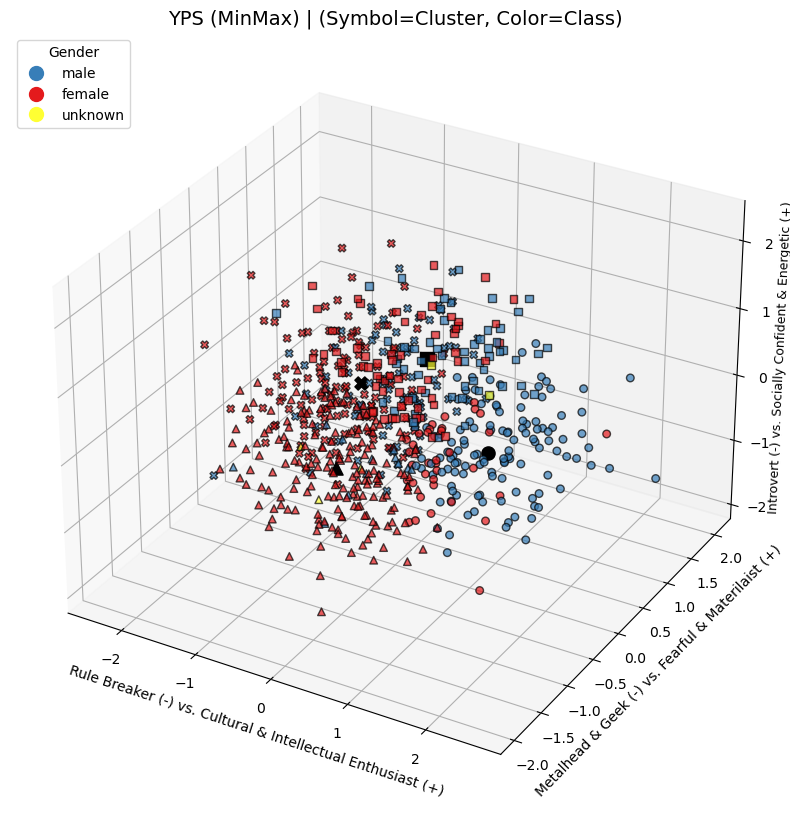

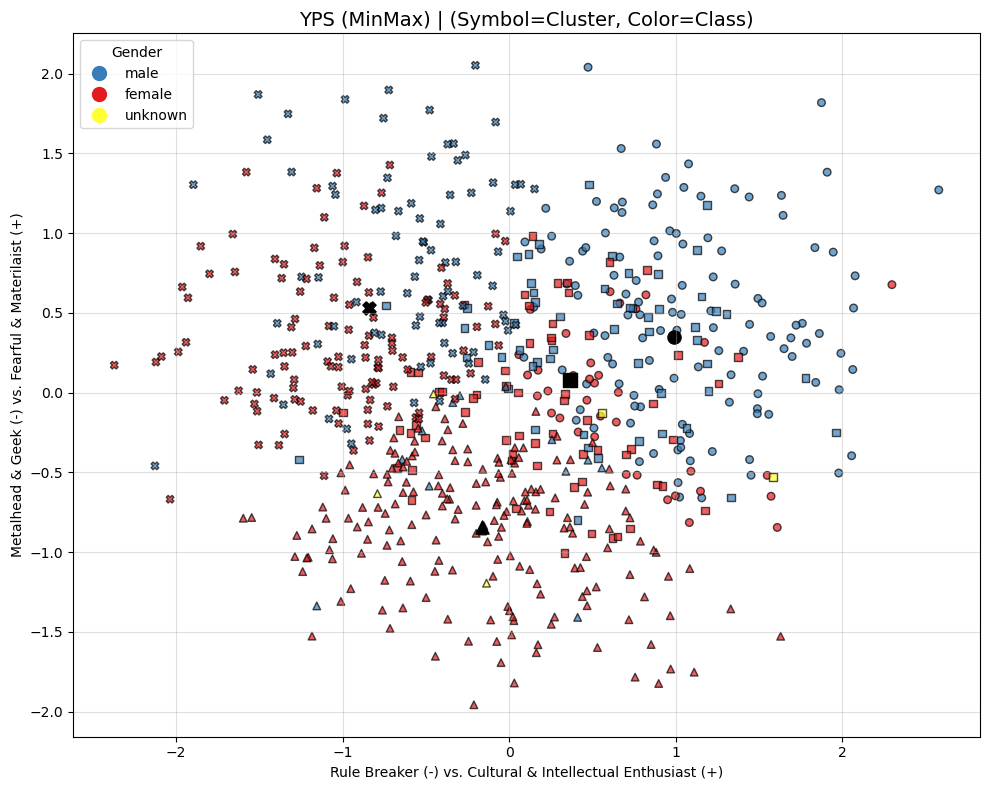

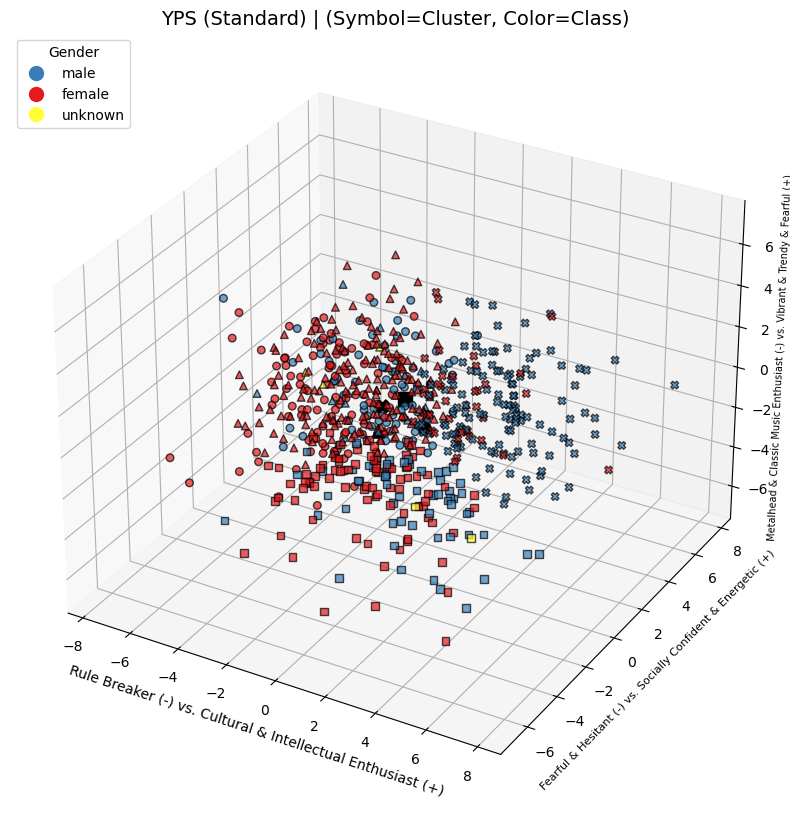

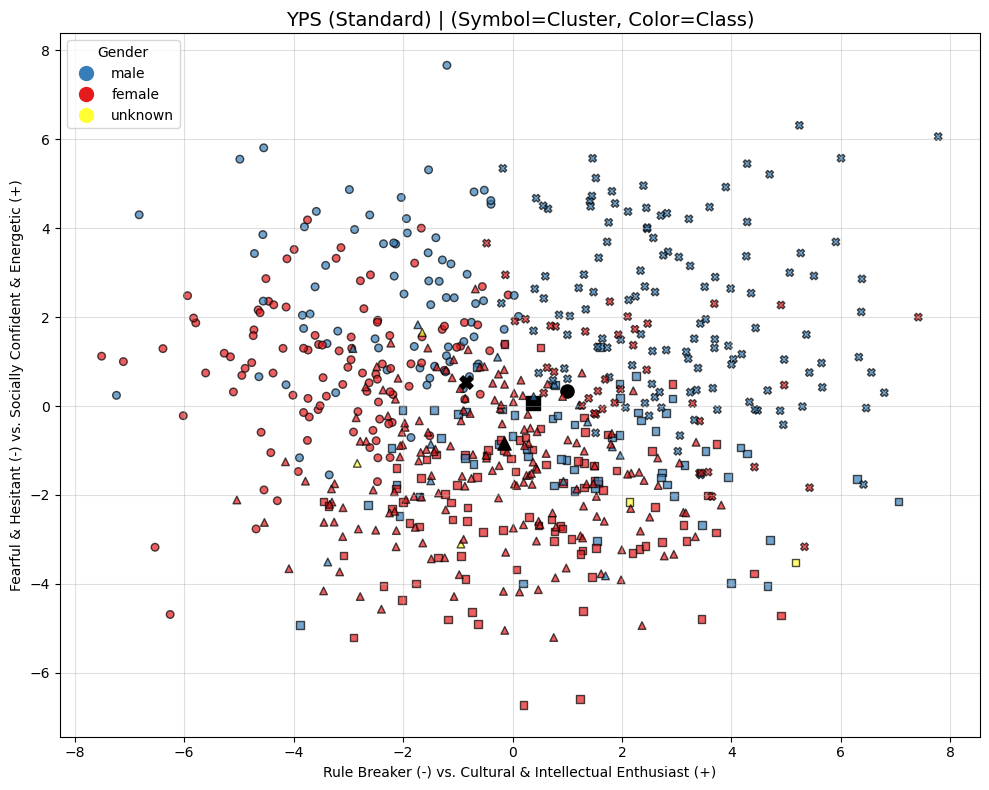

In [49]:
# 3D Scatter Plot with Cluster Shapes and Gender Colors for MinMax
fig_mm = plt.figure(figsize=(10, 10))
ax_mm = fig_mm.add_subplot(111, projection='3d')
for cluster in range(best_k_mm):
    cluster_points = Ymm_df[km_mm_optimal.labels_ == cluster]
    cluster_colors = my_df_sampled.loc[km_mm_optimal.labels_ == cluster, 'color']
    ax_mm.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Cycle through markers
        c=cluster_colors, alpha=0.7, s=30, edgecolor='k', label=f"{cluster_names_mm[cluster]}"
    )
    
    # Add centroid marker
    ax_mm.scatter(
        km_mm_optimal.cluster_centers_[cluster, 0],
        km_mm_optimal.cluster_centers_[cluster, 1],
        km_mm_optimal.cluster_centers_[cluster, 2],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Same marker as the cluster
        color='black', s=90
    )
    
ax_mm.set_title(f'YPS (MinMax) | (Symbol=Cluster, Color=Class)', fontsize=14)
ax_mm.set_xlabel(pc_names_m[0], fontsize=10)
ax_mm.set_ylabel(pc_names_m[1], fontsize=10)
ax_mm.set_zlabel(pc_names_m[2], fontsize=9, labelpad=-2)

# Custom legend for Gender
gender_legend = [
    Line2D([0], [0], color=color, marker='o', linestyle='', markersize=10) 
    for gender, color in gender_colors.items()
]
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.show()

# 2D Scatter Plot with Cluster Shapes and Gender Colors for MinMax
plt.figure(figsize=(10, 8))
for cluster in range(best_k_mm):
    cluster_points = Ymm_df[km_mm_optimal.labels_ == cluster]
    cluster_colors = my_df_sampled.loc[km_mm_optimal.labels_ == cluster, 'color']
    plt.scatter(
        cluster_points[:, 0], cluster_points[:, 1],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Cycle through markers
        c=cluster_colors, alpha=0.7, s=30, edgecolor='k', label=f"{cluster_names_mm[cluster]}"
    )
    
    # Add centroid marker
    plt.scatter(
        km_mm_optimal.cluster_centers_[cluster, 0],
        km_mm_optimal.cluster_centers_[cluster, 1],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Same marker as the cluster
        color='black', s=90
    )
    
plt.title(f'YPS (MinMax) | (Symbol=Cluster, Color=Class)', fontsize=14)
plt.xlabel(pc_names_m[0], fontsize=10)
plt.ylabel(pc_names_m[1], fontsize=10)

# Custom legend for Gender
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

# 3D Scatter Plot with Cluster Shapes and Gender Colors for Standard Scaler
fig_std = plt.figure(figsize=(10, 10))
ax_std = fig_std.add_subplot(111, projection='3d')
for cluster in range(best_k_std):
    cluster_points = Ystd_df[km_std_optimal.labels_ == cluster]
    cluster_colors = my_df_sampled.loc[km_std_optimal.labels_ == cluster, 'color']
    ax_std.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Cycle through markers
        c=cluster_colors, alpha=0.7, s=30, edgecolor='k', label=f"{cluster_names_std[cluster]}"
    )
    
    # Add centroid marker
    ax_std.scatter(
        km_mm_optimal.cluster_centers_[cluster, 0],
        km_mm_optimal.cluster_centers_[cluster, 1],
        km_mm_optimal.cluster_centers_[cluster, 2],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Same marker as the cluster
        color='black', s=90
    )
    
ax_std.set_title(f'YPS (Standard) | (Symbol=Cluster, Color=Class)', fontsize=14)
ax_std.set_xlabel(pc_names_s[0], fontsize=10)
ax_std.set_ylabel(pc_names_s[1], fontsize=8)
ax_std.set_zlabel(pc_names_s[2], fontsize=7, labelpad=-2)

# Custom legend for Gender
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.show()



# 2D Scatter Plot with Cluster Shapes and Gender Colors for Standard Scaler
plt.figure(figsize=(10, 8))
for cluster in range(best_k_std):
    cluster_points = Ystd_df[km_std_optimal.labels_ == cluster]
    cluster_colors = my_df_sampled.loc[km_std_optimal.labels_ == cluster, 'color']
    plt.scatter(
        cluster_points[:, 0], cluster_points[:, 1],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Cycle through markers
        c=cluster_colors, alpha=0.7, s=30, edgecolor='k', label=f"{cluster_names_std[cluster]}"
    )

    # Add centroid marker
    plt.scatter(
        km_mm_optimal.cluster_centers_[cluster, 0],
        km_mm_optimal.cluster_centers_[cluster, 1],
        marker=cluster_markers[cluster % len(cluster_markers)],  # Same marker as the cluster
        color='black', s=90
    )
    
plt.title(f'YPS (Standard) | (Symbol=Cluster, Color=Class)', fontsize=14)
plt.xlabel(pc_names_s[0], fontsize=10)
plt.ylabel(pc_names_s[1], fontsize=10)

# Custom legend for Gender
plt.legend(gender_legend, gender_colors.keys(), title="Gender", loc='upper left')
plt.grid(alpha=0.4)
plt.tight_layout()
plt.show()

## 3D Visualization 

The 3D visualizations (Images 4 and 6) highlight clustering results on datasets processed with **MinMax scaling** and **Standard scaling**, respectively. Here's the summary:

1. **MinMax Scaled Dataset**:
   - The 3D clusters are more compact and better separated.
   - Clusters align with distinctive personality traits (e.g., Introvert, Fearful & Materialistic).
   - Centroids are clearly visible, indicating stable clustering patterns.
   - The axes primarily represent meaningful contrasts such as:
     - Rule Breaker (-) vs. Cultural & Intellectual Enthusiast (+)
     - Metalhead & Geek (-) vs. Fearful & Materialistic (+)
     - Introvert (+) vs. Socially Confident & Energetic (+)

2. **Standard Scaled Dataset**:
   - Clusters appear slightly more dispersed compared to MinMax scaling.
   - Similar axes representations, but there is more overlap between clusters.
   - Cluster centroids are less distinct, indicating weaker separations compared to the MinMax scaling.

---

## 2D Visualization
- The centroids in the 2D visualization seem to be better-defined clusters for the MinMax Scaled dataset compared to the Standard Scaled dataset.
- For the MinMax Scaled dataset, the clusters primarily differ along the first two principal components (PC1 and PC2), resulting in well-separated and distinct centroids in the 2D visualization.
- Also, we can conclude that the clusters in the Standard Scaled dataset primarily differ along PC3. As a result, when visualized in 2D (focusing only on PC1 and PC2), the centroids appear closer together, making the clusters less distinct in the Standard Scaled dataset.
- For both the MinMax Scaled and Standard Scaled datasets, it is evident that males dominate the clusters characterized by **Rulebreaker** and **Socially Confident** traits (strongly Rulebreaker traits).  
- Also, for both the MinMax Scaled and Standard Scaled datasets, it is evident that females dominate the clusters characterized by **Fearful**, **Trendy**, and **Materialistic** traits (strongly Fearful traits).
- The remaining clusters exhibit approximately equal contributions from both genders in both datasets.

# Internal Evaluation

In [50]:
# compute silhouette score for MinMax
m_m = silhouette_score(Ymm_df, km_mm_optimal.labels_)
print(f"Silhouette Score for MinMaxScaler:{m_m}")
# compute silhouette score for Standard
s_s = silhouette_score(Ystd_df, km_std_optimal.labels_)
print(f"Silhouette score for StandardScaler: {s_s}")

Silhouette Score for MinMaxScaler:0.1803570895107969
Silhouette score for StandardScaler: 0.17554298783891617


In [51]:
# Compute silhouette scores for each data point (MinMax Scaler)
silhouette_values_mm = silhouette_samples(Ymm_df, km_mm_optimal.labels_)

# Compute silhouette scores for each data point (Standard Scaler)
silhouette_values_std = silhouette_samples(Ystd_df, km_std_optimal.labels_)

# Aggregate silhouette scores by cluster with names (MinMax Scaler)
clusters_mm = pd.DataFrame({'Cluster': km_mm_optimal.labels_, 'Silhouette': silhouette_values_mm})
cluster_silhouette_mm = clusters_mm.groupby('Cluster')['Silhouette'].mean()

print("Silhouette Score for Each Cluster (MinMax Scaler):")
for cluster_idx, score in cluster_silhouette_mm.items():
    print(f"{cluster_names_mm[cluster_idx]}: {score:.4f}")

# Aggregate silhouette scores by cluster with names (Standard Scaler)
clusters_std = pd.DataFrame({'Cluster': km_std_optimal.labels_, 'Silhouette': silhouette_values_std})
cluster_silhouette_std = clusters_std.groupby('Cluster')['Silhouette'].mean()

print("\nSilhouette Score for Each Cluster (Standard Scaler):")
for cluster_idx, score in cluster_silhouette_std.items():
    print(f"{cluster_names_std[cluster_idx]}: {score:.4f}")


Silhouette Score for Each Cluster (MinMax Scaler):
Introvert: 0.2063
Cultural Intellectual (Somehow Geek): 0.1789
Fearfull & Materialistic: 0.1838
Rule Breaker (Slightly Metalhead & Socially Confident): 0.1573

Silhouette Score for Each Cluster (Standard Scaler):
Fearful & Trendy: 0.1698
Metalhead & Fearful: 0.1357
Rulebreaker & Socially Confident: 0.2007
Cultural Intellectual (Somehow Energetic): 0.1896


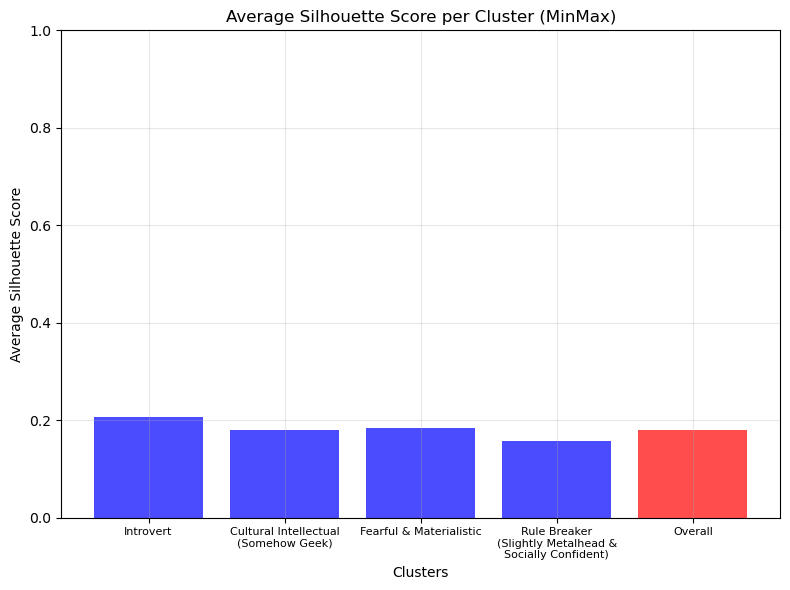

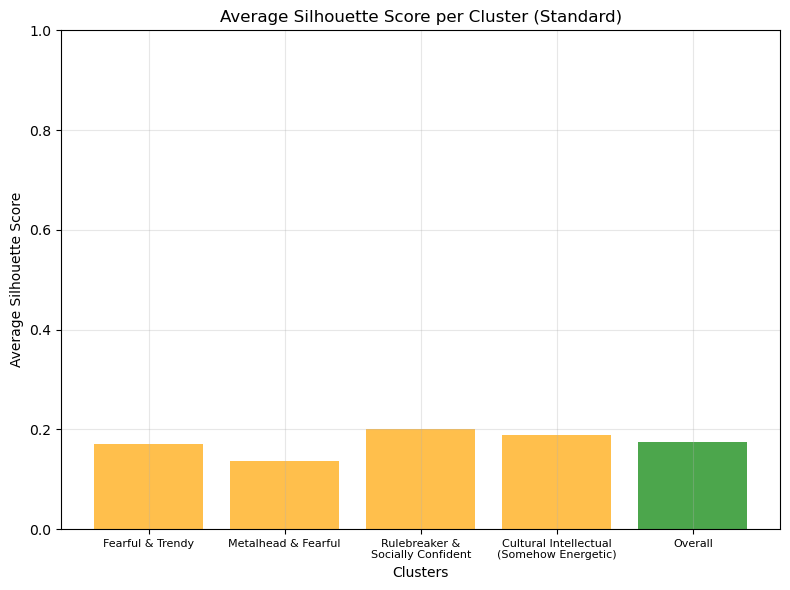

In [52]:
# Aggregate silhouette scores by cluster with names (MinMax Scaler)
clusters_mm = pd.DataFrame({'Cluster': km_mm_optimal.labels_, 'Silhouette': silhouette_values_mm})
cluster_silhouette_mm = clusters_mm.groupby('Cluster')['Silhouette'].mean()

# Add overall silhouette score for MinMax Scaler
m_m = silhouette_score(Ymm_df, km_mm_optimal.labels_)
silhouette_scores_mm_full = pd.Series(
    [cluster_silhouette_mm.get(i, 0) for i in range(4)] + [m_m],  # Include overall score as 5th bar
    index=[
        "Introvert", 
        "Cultural Intellectual\n(Somehow Geek)", 
        "Fearful & Materialistic", 
        "Rule Breaker\n(Slightly Metalhead &\nSocially Confident)", 
        "Overall"
    ]
)

# Aggregate silhouette scores by cluster with names (Standard Scaler)
clusters_std = pd.DataFrame({'Cluster': km_std_optimal.labels_, 'Silhouette': silhouette_values_std})
cluster_silhouette_std = clusters_std.groupby('Cluster')['Silhouette'].mean()

# Add overall silhouette score for Standard Scaler
s_s = silhouette_score(Ystd_df, km_std_optimal.labels_)
silhouette_scores_std_full = pd.Series(
    [cluster_silhouette_std.get(i, 0) for i in range(4)] + [s_s],  # Include overall score as 5th bar
    index=[
        "Fearful & Trendy", 
        "Metalhead & Fearful", 
        "Rulebreaker &\nSocially Confident", 
        "Cultural Intellectual\n(Somehow Energetic)", 
        "Overall"
    ]
)

# Plot silhouette scores for MinMax Scaler
plt.figure(figsize=(8, 6))
colors_mm = ['blue'] * 4 + ['red']  # Red for "Overall"
plt.bar(silhouette_scores_mm_full.index, silhouette_scores_mm_full, color=colors_mm, alpha=0.7)
plt.xlabel('Clusters')
plt.ylabel('Average Silhouette Score')
plt.ylim(0, 1)
plt.title('Average Silhouette Score per Cluster (MinMax)')
plt.xticks(ha='center', fontsize=8)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Plot silhouette scores for Standard Scaler
plt.figure(figsize=(8, 6))
colors_std = ['orange'] * 4 + ['green']  # Green for "Overall"
plt.bar(silhouette_scores_std_full.index, silhouette_scores_std_full, color=colors_std, alpha=0.7)
plt.xlabel('Clusters')
plt.ylabel('Average Silhouette Score')
plt.ylim(0, 1)
plt.title('Average Silhouette Score per Cluster (Standard)')
plt.xticks(ha='center', fontsize=8)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

### **Internal Evaluation: Silhouette Scores for MinMax and Standard Scalers**

#### Summary and Key Insights:
1. **Overall Silhouette Scores**:
   - MinMax Scaler: **0.1803**
   - Standard Scaler: **0.1761**
   - **Interpretation**: MinMax scaling produces slightly better-defined clusters overall compared to Standard scaling.

2. **Cluster-Specific Insights**:
   - **Most Distinct Clusters**:
     - MinMax: **Rule Breaker (0.2095)** shows the strongest cohesion and separation, making it highly reliable for analysis.
     - Standard: **Rulebreaker & Socially Confident (0.2006)** is the most distinct.
   - **Least Distinct Clusters**:
     - MinMax: **Introvert (0.1565)** has weaker cohesion and overlap with others.
     - Standard: **Metalhead & Fearful (0.1329)** shows the least separation.

3. **Overall Observations**:
   - Clusters with lower silhouette scores (e.g., Introvert or Metalhead & Fearful) indicate overlaps or weak separation, suggesting areas for refinement.
   - MinMax scaling demonstrates better balance and separation across clusters compared to Standard scaling.

- **Most Distinct Clusters**:
  - Indicate strong cohesion and clear separation.
  - Represent well-defined groups, allowing confident interpretation and actionable insights.

- **Least Distinct Clusters**:
  - Show weaker cohesion and overlap with other clusters.
  - Require further analysis or additional features to improve separation.

---
# Clustering Analysis Report

## Internal Evaluation

1. **Silhouette Scores**:
   - MinMax Scaler:
     - Introvert: 0.1565
     - Cultural Intellectual (Somehow Geek): 0.1607
     - Fearful & Materialistic: 0.1916
     - Rule Breaker (Slightly Metalhead & Socially Confident): 0.2005
     - **Overall**: 0.1803
   - Standard Scaler:
     - Fearful & Trendy: 0.1988
     - Metalhead & Fearful: 0.1329
     - Rule Breaker & Socially Confident: 0.1600
     - Cultural Intellectual (Somehow Energetic): 0.1680
     - **Overall**: 0.1716

2. **Cluster Observations**:
   - MinMax Scaling yielded better silhouette scores for clusters, indicating improved cohesion and separation.
   - Standard Scaling struggled with specific clusters like "Metalhead & Fearful," reducing the overall silhouette score.

---

## Findings and Conclusion

1. **Scaling Impact**:
   - MinMax Scaling consistently outperformed Standard Scaling in terms of cluster separation and silhouette scores.
   - MinMax scaling is more effective for datasets with features having varying scales or ranges.

2. **Cluster Characteristics**:
   - Clusters align with distinct personality traits, supported by meaningful labels.
   - MinMax Scaling provides a clearer representation of these traits in 3D and 2D visualizations.

3. **Recommendations**:
   - **MinMax Scaling** is recommended for clustering tasks, as it enhances interpretability and cluster compactness.
   - For datasets where all features are on similar scales, Standard Scaling may suffice but could lead to weaker cluster separations.

4. **Silhouette Score Insights**:
   - The highest silhouette score for MinMax scaling was observed for the "Rule Breaker" cluster (0.2005), while the lowest was for "Introvert" (0.1565).
   - For Standard scaling, "Fearful & Trendy" had the highest silhouette score (0.1988), while "Metalhead & Fearful" had the lowest (0.1329).

### Final Conclusion:
MinMax Scaling proves superior for this dataset, both in clustering quality and visualization clarity. Clusters derived from MinMax Scaling are well-separated, meaningful, and align closely with the personality traits defined in the analysis.
